In [1]:
import scanpy as sc
import matplotlib as mpl
import pandas as pd
import matplotlib.pyplot as plt
import bbknn
import scipy.stats
import numpy as np

In [2]:
import sys
sys.path.insert(0, "../lib")

In [4]:
import sc_utils

In [66]:
import importlib
importlib.reload(sc_utils)

<module 'sc_utils' from '../lib/sc_utils.py'>

In [5]:
mpl.rcParams["figure.figsize"] = (16, 12)
pd.set_option('display.max_rows', 1000)

Load preprint object

In [5]:
prev = sc.read_h5ad("../data/02preprint/10obj-named.h5ad")

Load revision object after cleaning doublets and low-quality clusters (see 01filtering.ipynb) & after correcting every sample with FastCAR (see Snakefile) after seeing IGLV* expression in macrophages

And then we excluded Patient D (see 02tram-day0.ipynb)

In [29]:
ds = sc.read_h5ad("../data/04dataset/03obj.h5ad")

In [8]:
ds.shape

(106407, 21819)

Add common metadata

In [9]:
ds.obs["cluster"] = "Unknown"

In [10]:
prev_cluster = prev.obs.cluster
prev_cluster = prev_cluster.loc[prev_cluster.index.isin(ds.obs_names)]

In [11]:
ds.obs.loc[prev_cluster.index, "cluster"] = prev_cluster

In [12]:
ds.obs["COVID-19"] = True
ds.obs.loc[ds.obs["orig.ident"].isin([
    "Sample_8", "Sample_9", "Sample_10", "Sample_11"
]), "COVID-19"] = False

In [15]:
ds.obs["COVID-19"] = ds.obs["COVID-19"].astype("category")
ds.obs["patient"] = ds.obs["patient"].astype("category")

In [16]:
sars_genes = ds.var_names[ds.var_names.str.startswith("SARS-CoV-2")]
sars_detected = (ds.raw.X[:, ds.var_names.isin(sars_genes)].todense() > 0).sum(axis=1).A[:, 0]
ds.obs["n_sars_genes"] = sars_detected

In [17]:
ds.obs["sample_status"] = "Cryo"
ds.obs.loc[ds.obs["orig.ident"].isin(prev.obs["orig.ident"].unique()), "sample_status"] = "Fresh"
ds.obs.sample_status = ds.obs.sample_status.astype("category")

In [18]:
ds.obs["celltype"] = ""

## Load genotype info for Sample_16

In [93]:
sample_16 = pd.read_csv("../data/03raw-data/souporcell/Sample_16/clusters.tsv", sep="\t", index_col=0)

In [94]:
sample_16.index = "Sample_16_" + sample_16.index.str.replace("-\d+$", "")

In [95]:
sample_16

,status,assignment,log_prob_singleton,log_prob_doublet,cluster0,cluster1
barcode,,,,,,
Sample_16_AAACCTGAGAAGATTC,singlet,1,-21.821187,-30.338752,-76.826876,-21.821187
Sample_16_AAACCTGAGAATCTCC,singlet,1,-79.945016,-111.324754,-260.385228,-79.945016
Sample_16_AAACCTGAGATAGCAT,singlet,1,-17.990679,-27.544660,-64.345918,-17.990679
Sample_16_AAACCTGAGCCCGAAA,singlet,1,-58.455904,-79.934708,-182.927550,-58.455904
Sample_16_AAACCTGAGGACAGAA,singlet,1,-24.331308,-30.286057,-76.814899,-24.331308
...,...,...,...,...,...,...
Sample_16_TTTGTCATCATTGCGA,singlet,1,-11.113716,-16.697416,-34.567660,-11.113716
Sample_16_TTTGTCATCCAGTATG,singlet,1,-72.099500,-121.178138,-334.617352,-72.099500
Sample_16_TTTGTCATCTCCAGGG,singlet,1,-114.555619,-727.192723,-4276.568564,-114.555619


In [96]:
cluster0_cells = sample_16.index[(sample_16.status == "singlet") & (sample_16.assignment == "0")]
cluster1_cells = sample_16.index[(sample_16.status == "singlet") & (sample_16.assignment == "1")]

In [97]:
cluster0_cells.size

5850

In [98]:
cluster1_cells.size

10095

In [99]:
to_remove = sample_16.index[sample_16.status != "singlet"]

In [100]:
to_remove.size + cluster0_cells.size + cluster1_cells.size == sample_16.shape[0]

True

In [ ]:
already_excluded = pd.read_csv("02cells-to-exclude.csv", index_col=0)

cells_to_exclude = pd.Series(ds.obs_names[ds.obs_names.isin(to_remove)])

pd.concat([pd.Series(already_excluded.index), cells_to_exclude], axis=0).to_csv(
    "03cells-to-exclude.csv",
    index=False,
    header=False
)

## Plot main plots:

clusters from preprint

/home/nmx5063/.local/share/virtualenvs/code-sz7XzLNG/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'cluster' as categorical
... storing 'celltype' as categorical


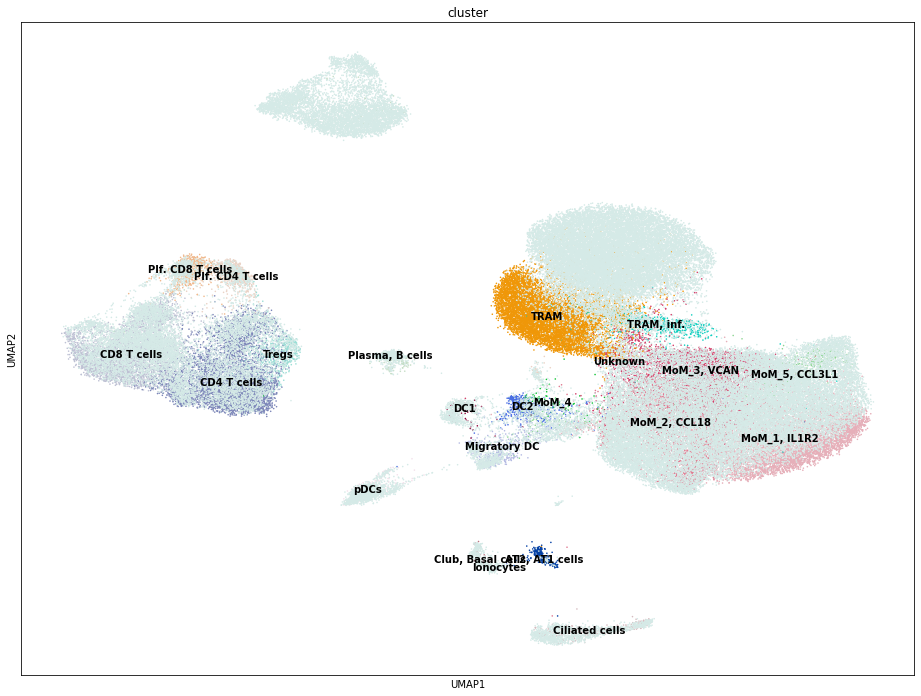

In [39]:
sc.pl.umap(ds, color="cluster", size=10, legend_loc="on data")

COVID-19 status

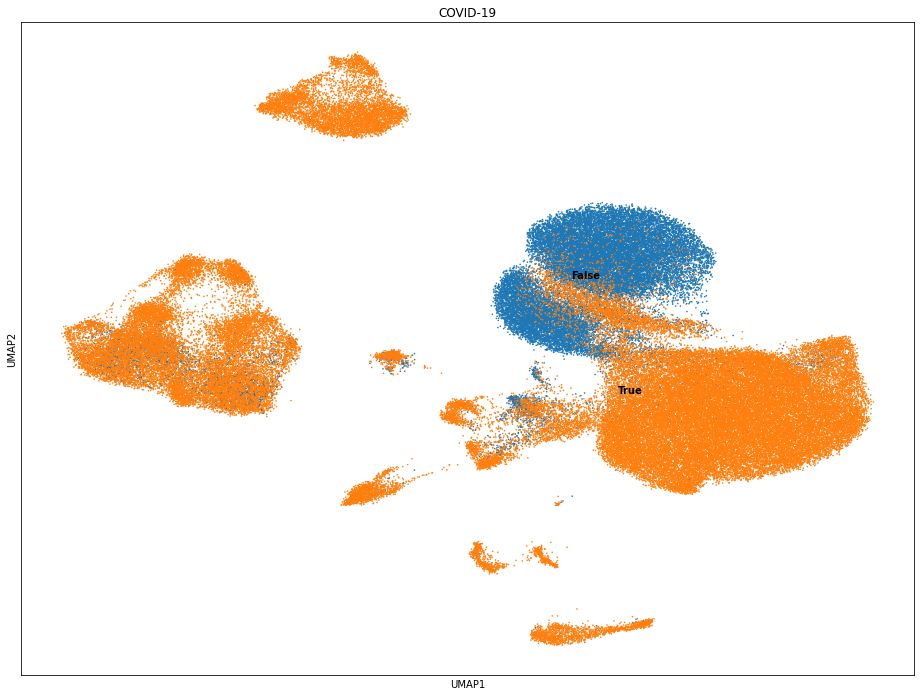

In [40]:
sc.pl.umap(ds, color="COVID-19", size=10, legend_loc="on data")

Patient

... storing 'cluster' as categorical
... storing 'celltype' as categorical


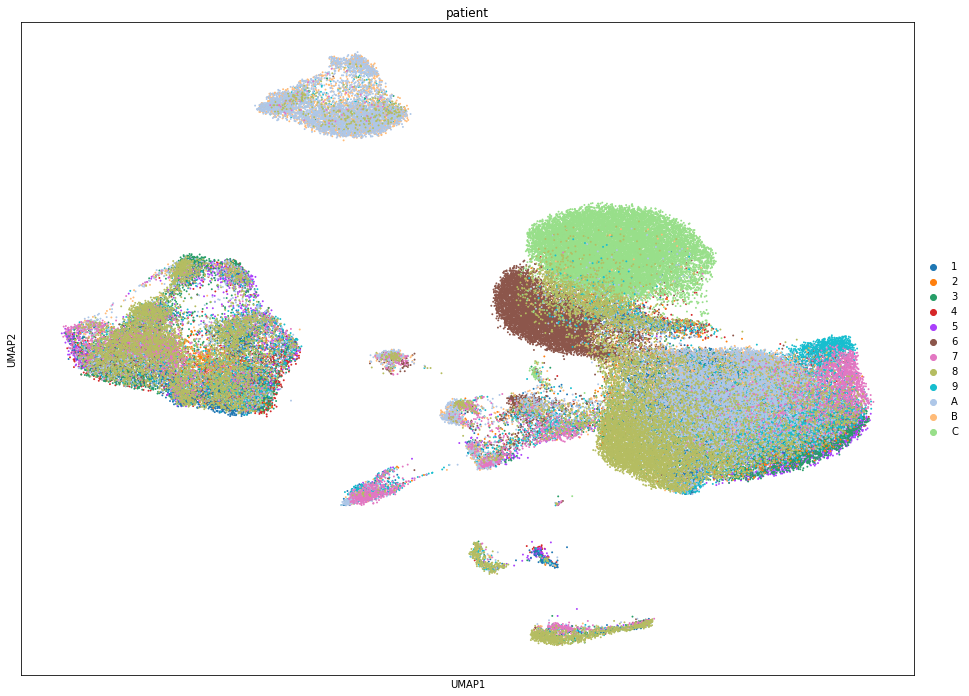

In [19]:
sc.pl.umap(ds, color="patient", size=15)

Sample status: fresh / cryo

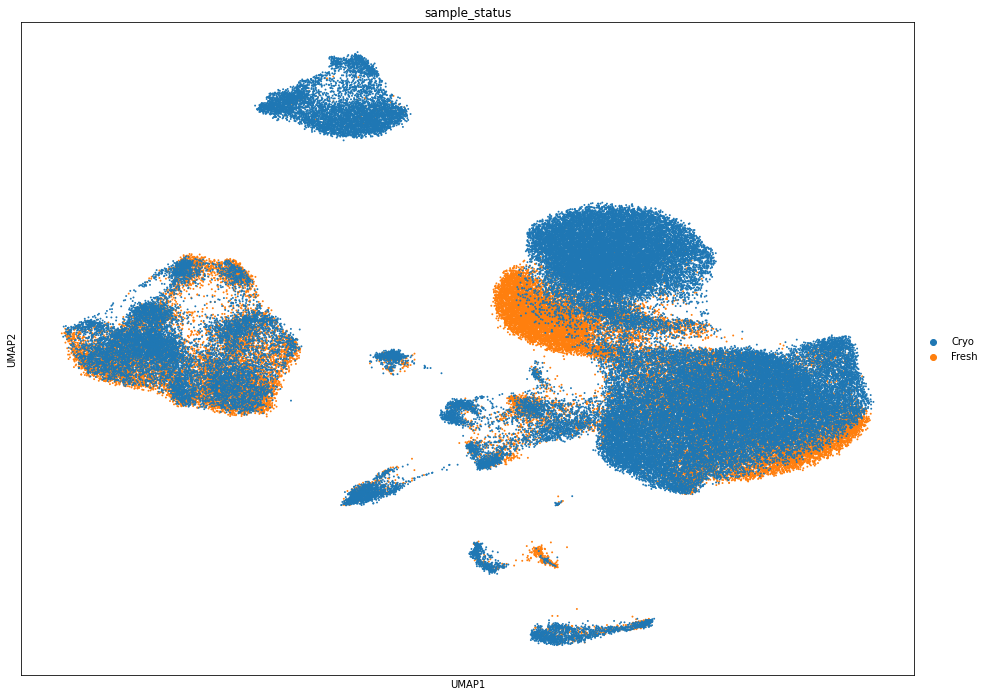

In [42]:
sc.pl.umap(ds, color="sample_status", size=15)

## Fresh / cryo samples difference

nUMIs vs nGenes plot

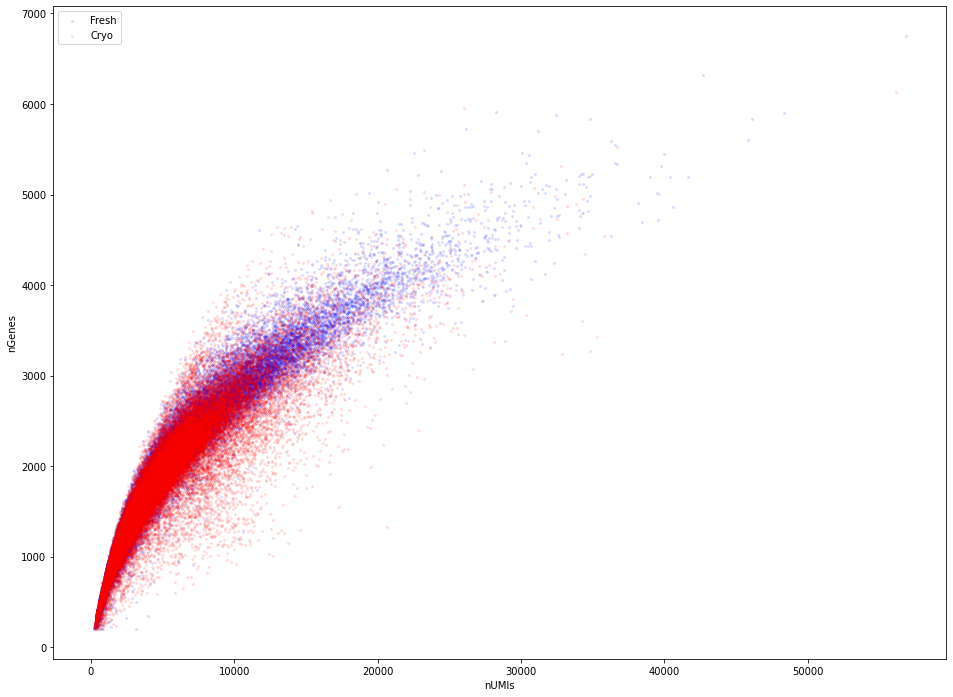

In [44]:
fig, ax = plt.subplots()
ax.scatter(ds.obs.total_counts[ds.obs.sample_status == "Fresh"], 
           ds.obs.n_genes_by_counts[ds.obs.sample_status == "Fresh"],
           c="b", alpha=0.1, s=4, label="Fresh")
ax.scatter(ds.obs.total_counts[ds.obs.sample_status == "Cryo"], 
           ds.obs.n_genes_by_counts[ds.obs.sample_status == "Cryo"],
           c="r", alpha=0.1, s=4, label="Cryo")
ax.set_xlabel("nUMIs")
ax.set_ylabel("nGenes")
ax.legend()

So Fresh samples reach out to higher values for both variables

nUMIs violin plot

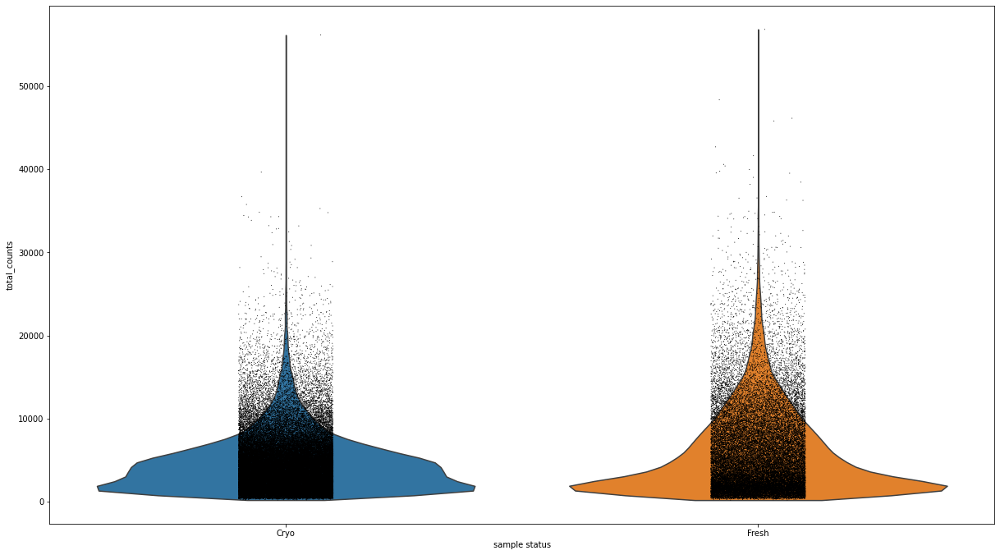

In [45]:
sc.pl.violin(ds, "total_counts", "sample_status")

% mito violin plot

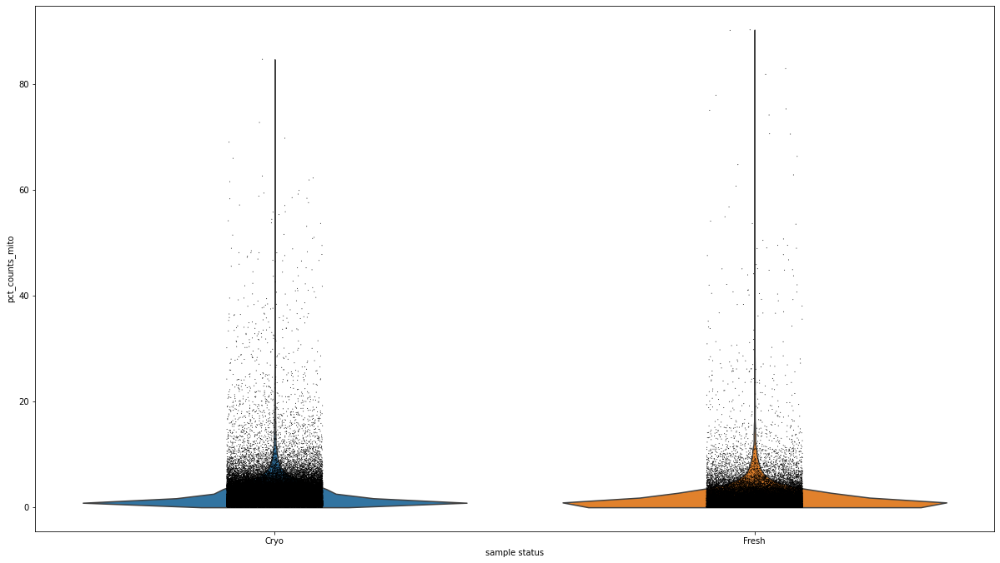

In [46]:
sc.pl.violin(ds, "pct_counts_mito", "sample_status")

nGenes violin plot

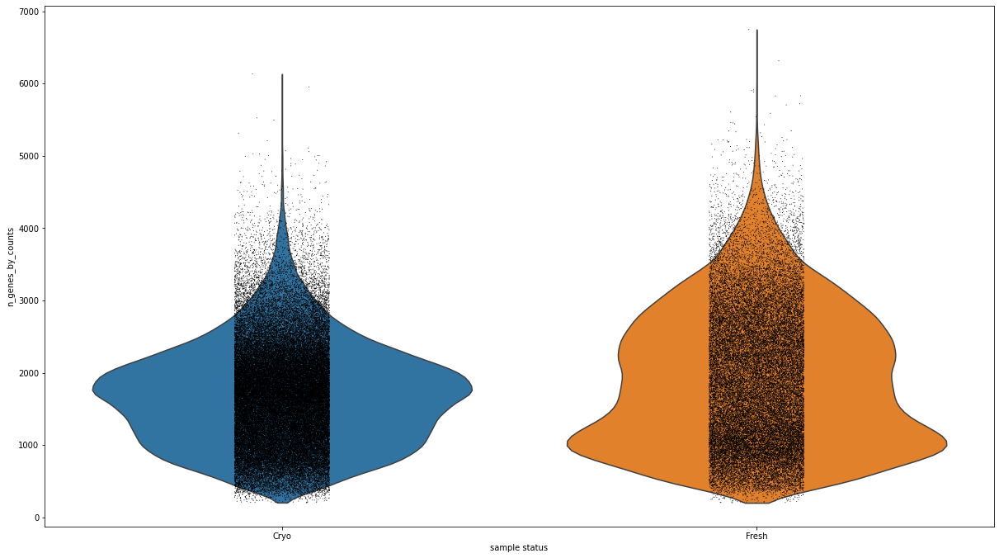

In [47]:
sc.pl.violin(ds, "n_genes_by_counts", "sample_status")

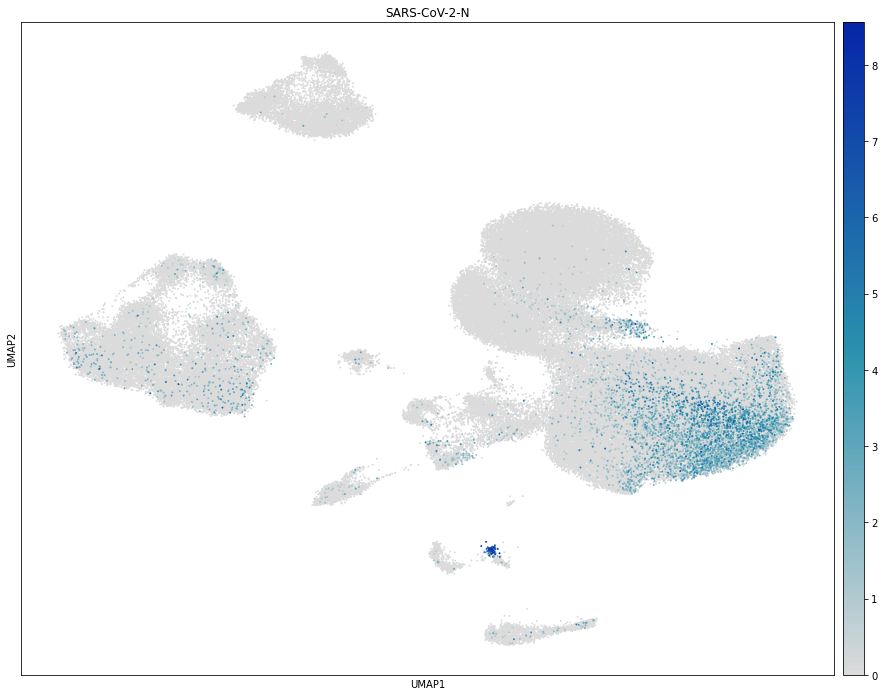

In [48]:
sc.pl.umap(ds, color="SARS-CoV-2-N", size=15, cmap=sc_utils.expr_colormap())

## Plot technical variables

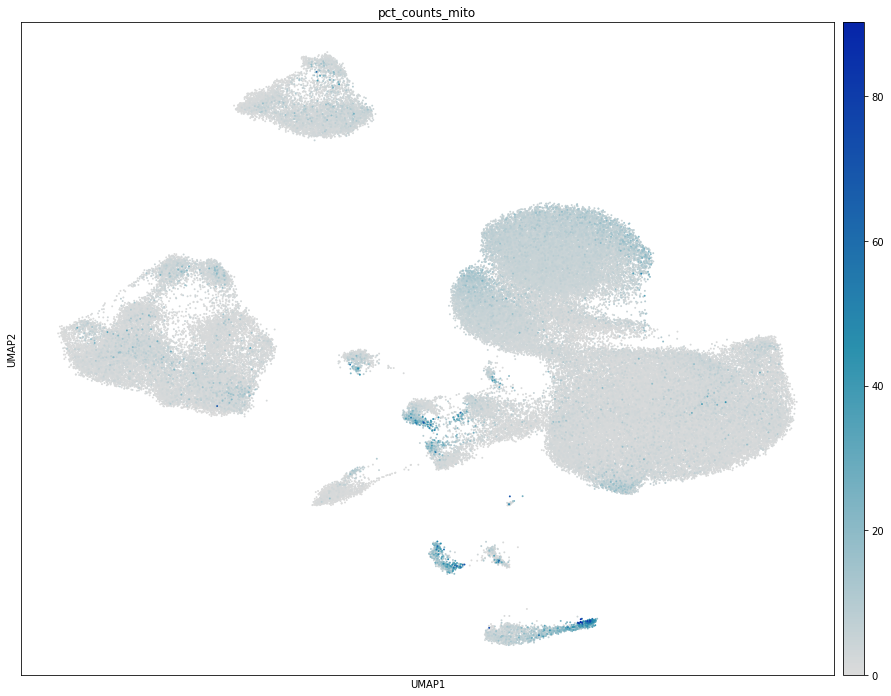

In [49]:
sc.pl.umap(ds, color="pct_counts_mito", size=15, cmap=sc_utils.expr_colormap())

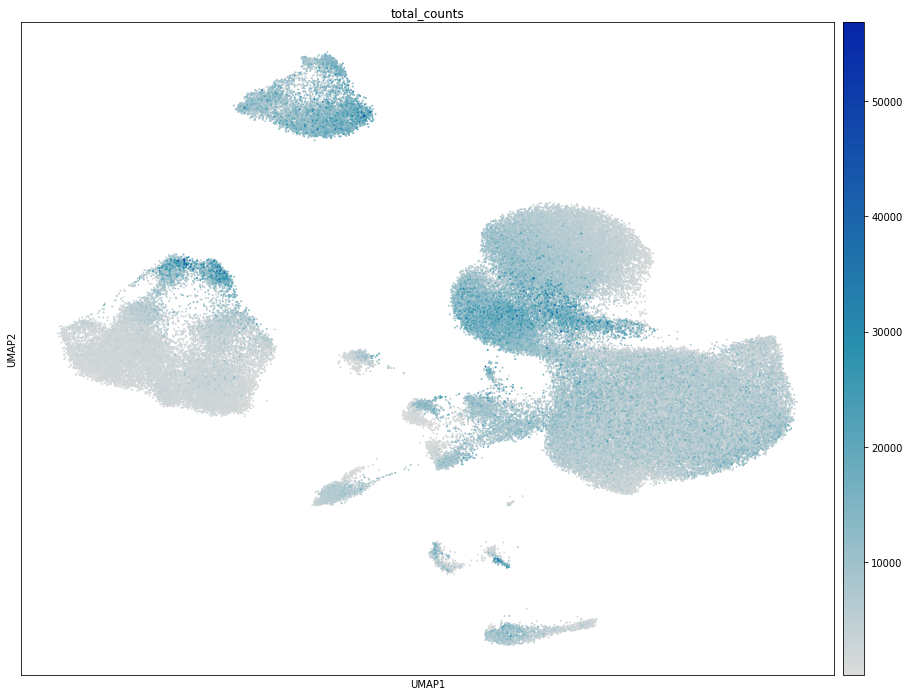

In [50]:
sc.pl.umap(ds, color="total_counts", size=15, cmap=sc_utils.expr_colormap())

Default low-resolution

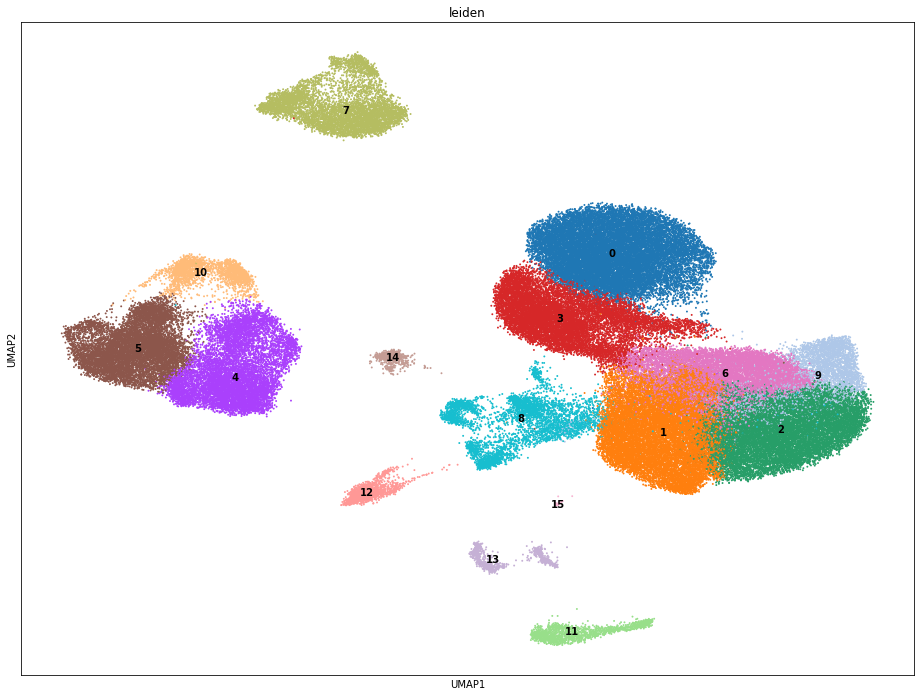

In [51]:
sc.pl.umap(ds, 
           color="leiden", 
           size=15, 
           legend_loc="on data")

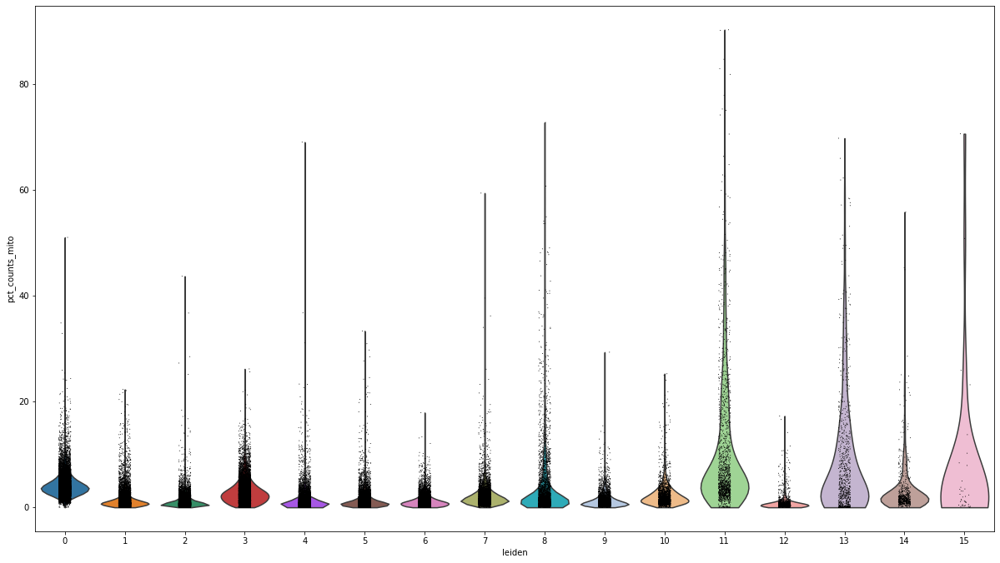

In [52]:
sc.pl.violin(ds, "pct_counts_mito", "leiden")

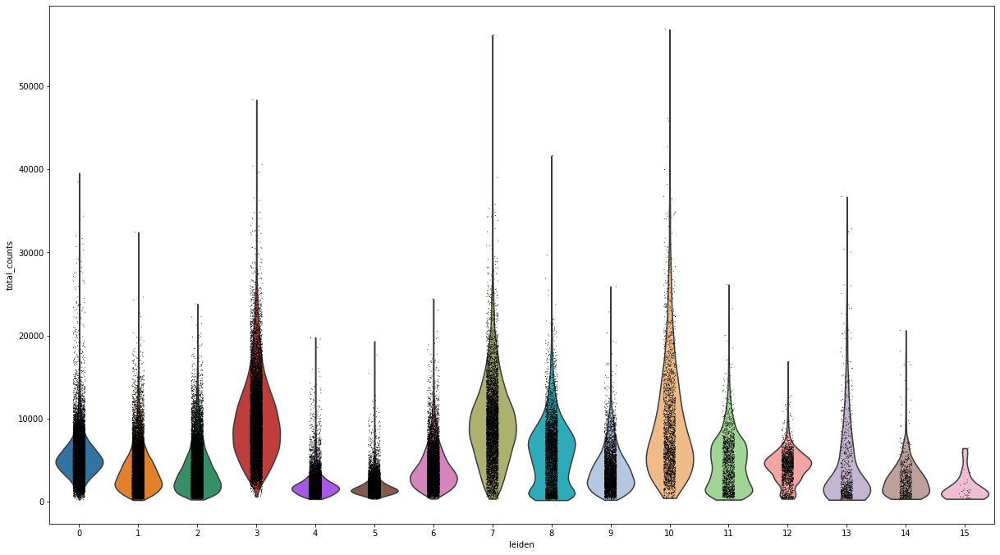

In [53]:
sc.pl.violin(ds, "total_counts", "leiden")

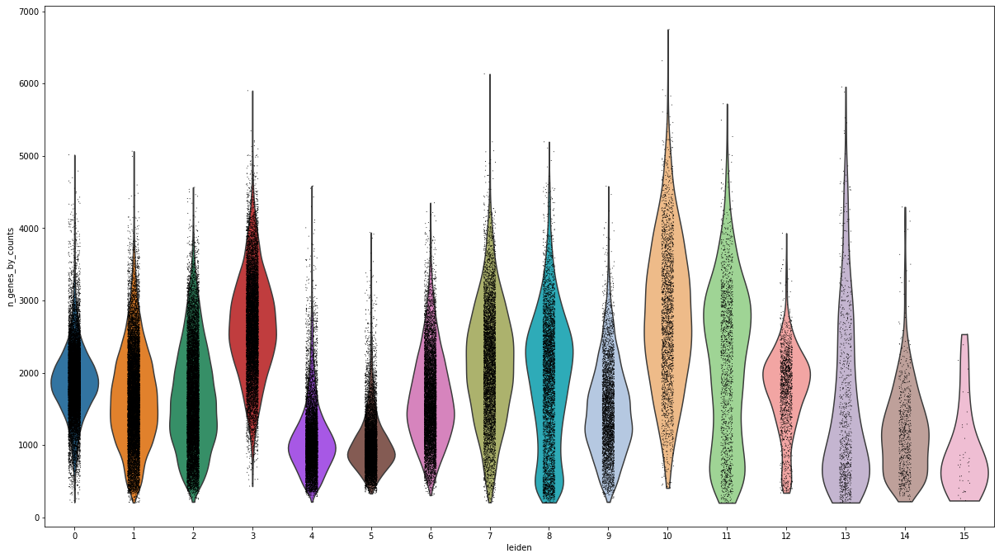

In [54]:
sc.pl.violin(ds, "n_genes_by_counts", "leiden")

Looks healthy, no additional filtering necessary

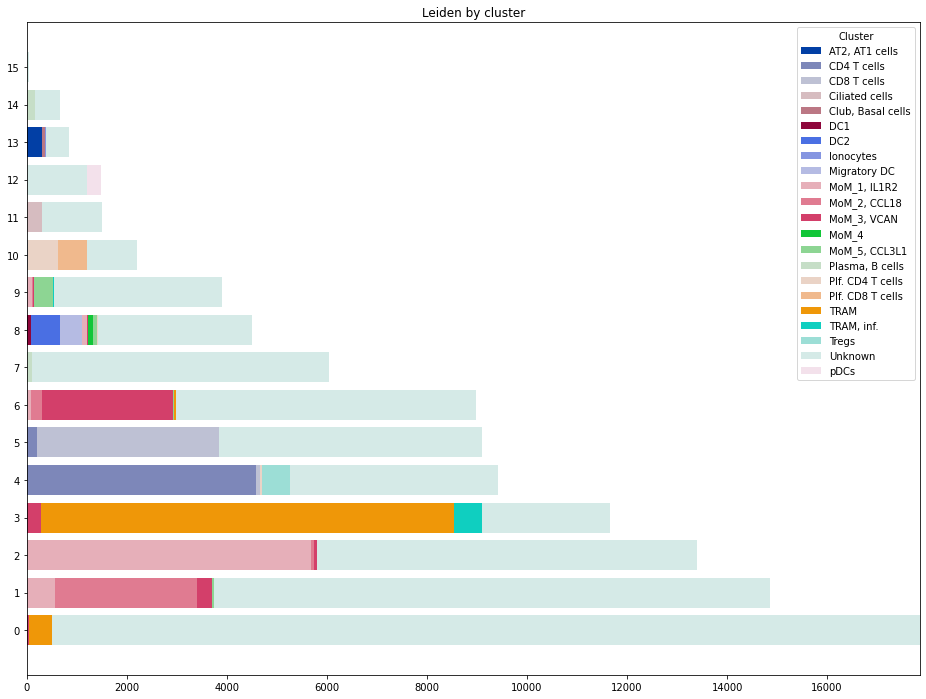

In [55]:
sc_utils.plot_composition(ds, "leiden", "cluster")

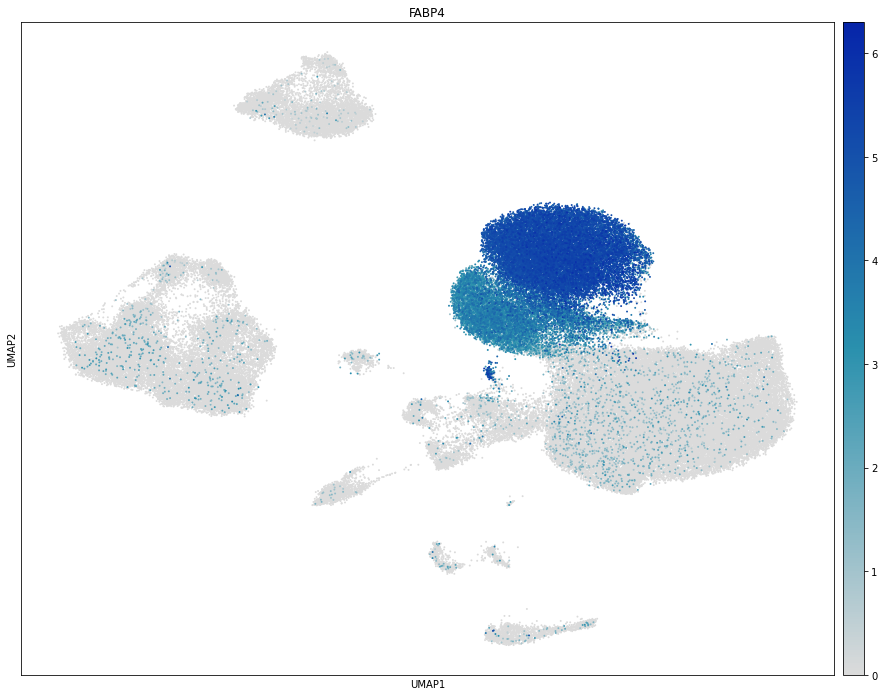

In [56]:
sc.pl.umap(ds, color="FABP4", size=15, cmap=sc_utils.expr_colormap())

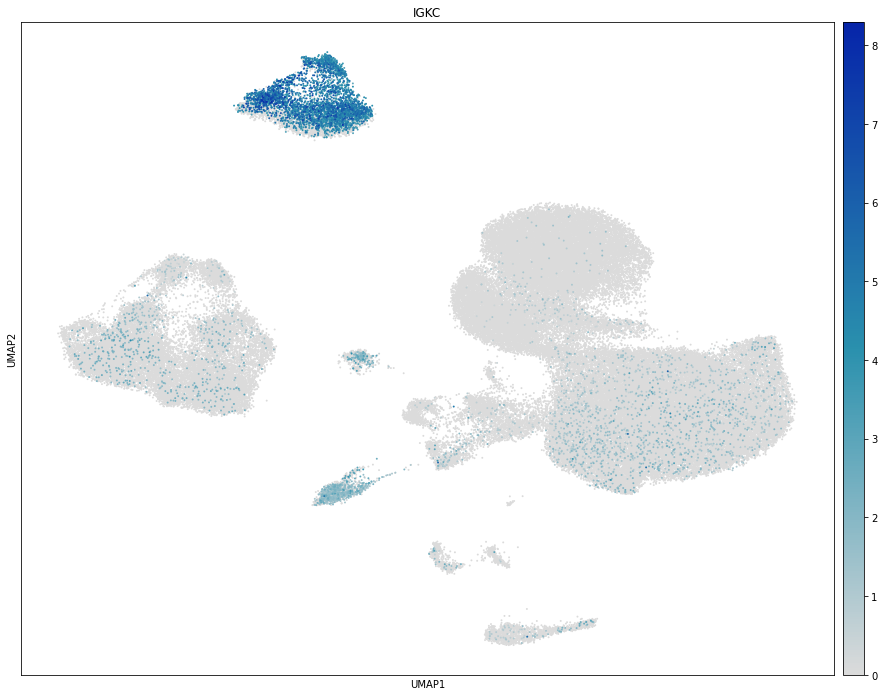

In [57]:
sc.pl.umap(ds, color="IGKC", size=15, cmap=sc_utils.expr_colormap())

## 1. Subcluster macrophages

In [20]:
macs = ds[ds.obs.leiden.isin(["0", "1", "2", "3", "6", "9"]), :]

In [21]:
macs = macs.raw.to_adata()

In [22]:
sc.pp.highly_variable_genes(macs, n_top_genes=2500, batch_key="orig.ident")

In [23]:
macs.var.highly_variable[macs.var_names.str.match("^SARS-CoV-2")] = False

/projects/b1038/Pulmonary/nmarkov/script/code/.venv/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [24]:
macs.raw = macs

In [25]:
sc.pp.scale(macs)
sc.tl.pca(macs, svd_solver="arpack")

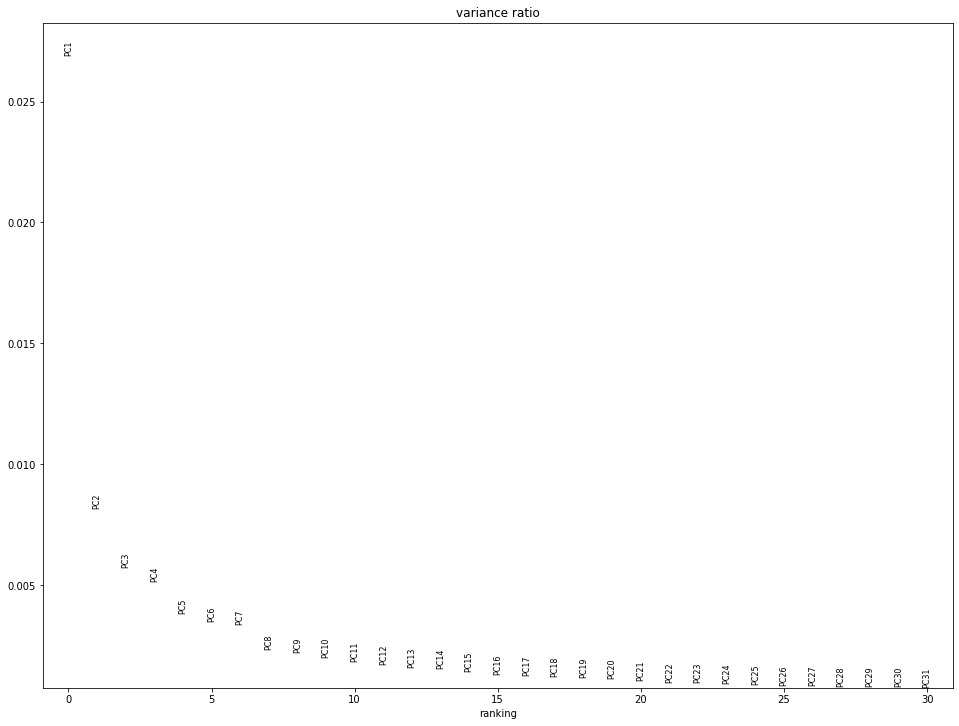

In [26]:
sc.pl.pca_variance_ratio(macs)

In [27]:
bbknn.bbknn(macs, neighbors_within_batch=int(100 / macs.obs.batch.unique().size), n_pcs=11)

In [28]:
sc.tl.leiden(macs, resolution=0.8)

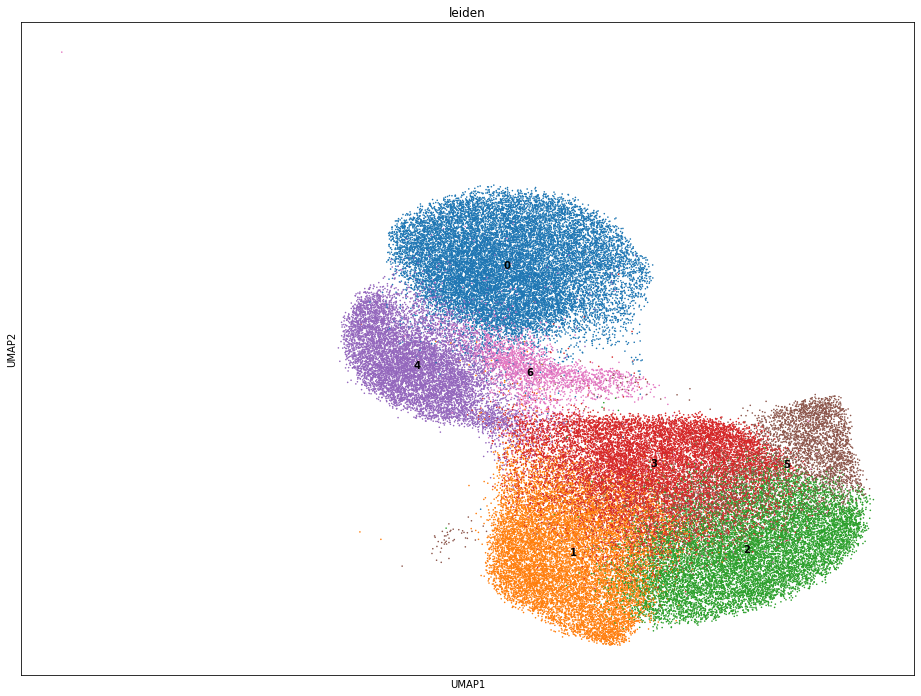

In [29]:
sc.pl.umap(macs, color="leiden", size=10, legend_loc="on data")

In [84]:
macs.obs.leiden[macs.obs.cluster == "TRAM, inf."].value_counts()

6    477
4     62
5     27
1      5
3      3
2      3
0      1
Name: leiden, dtype: int64

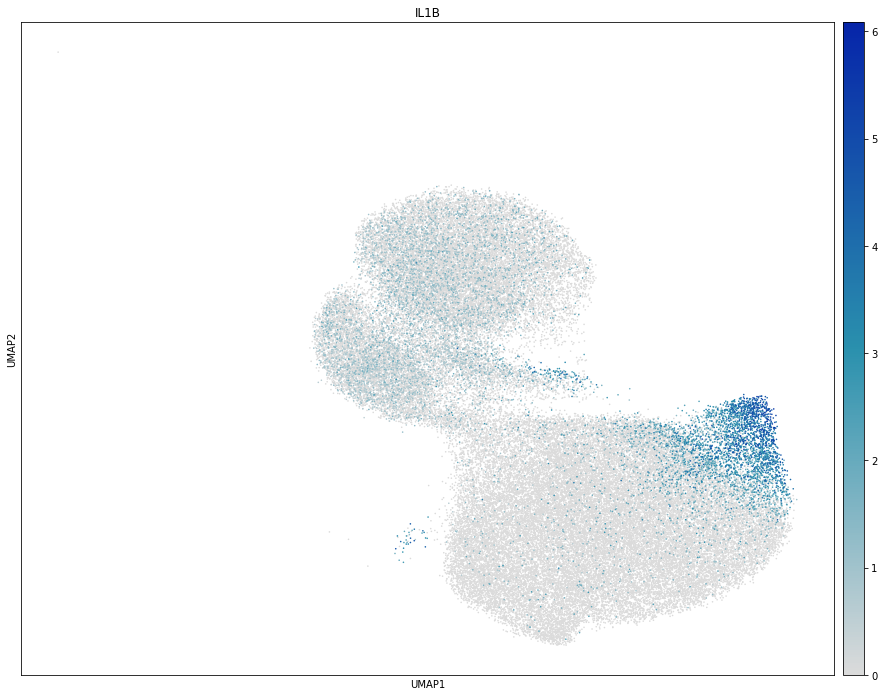

In [85]:
sc.pl.umap(macs, color="IL1B", size=10, cmap=sc_utils.expr_colormap())

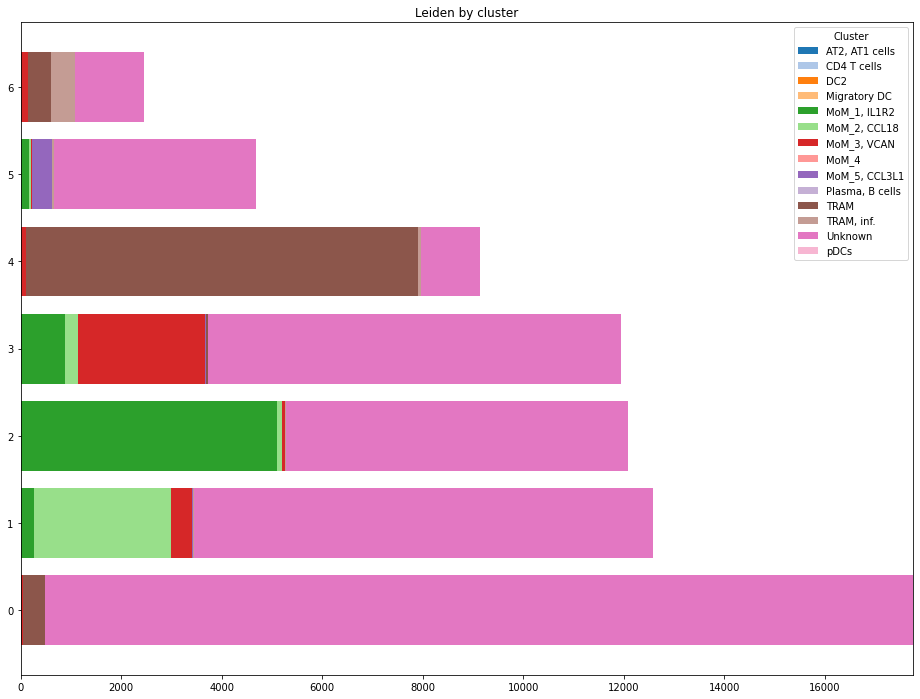

In [86]:
sc_utils.plot_composition(macs, "leiden", "cluster")

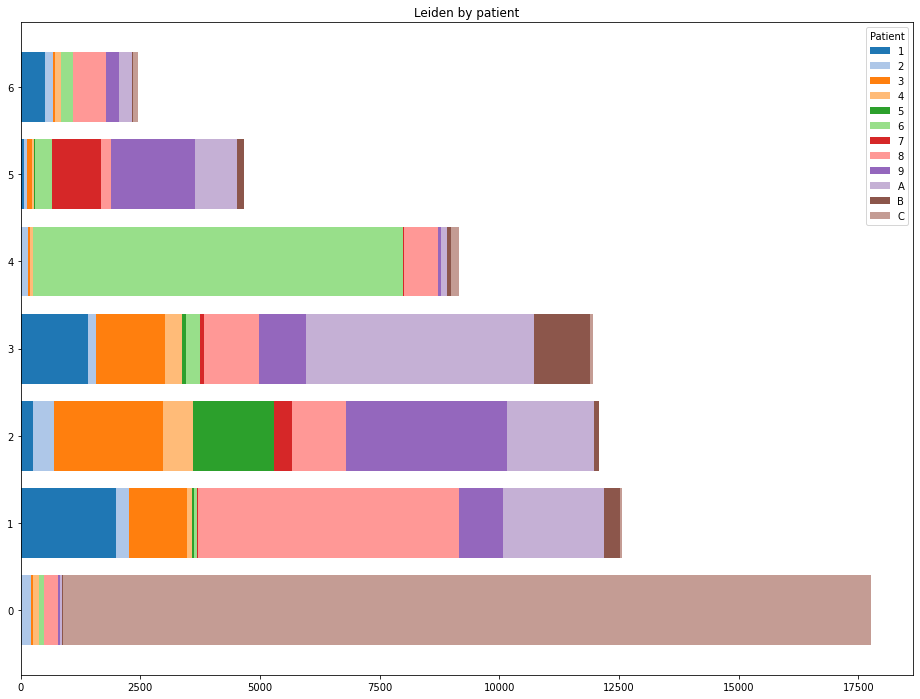

In [69]:
sc_utils.plot_composition(macs, "leiden", "patient")

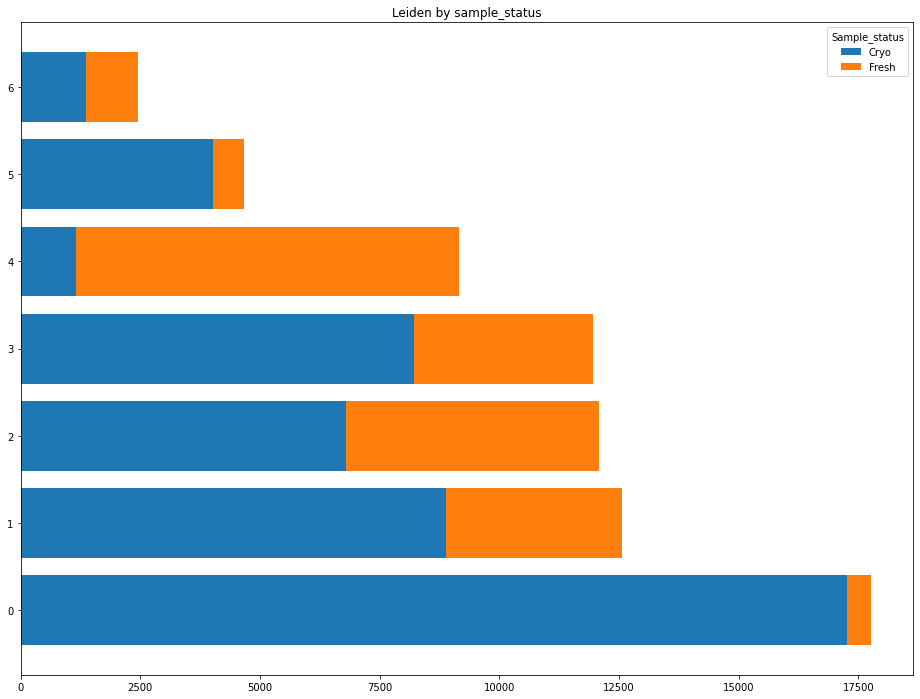

In [88]:
sc_utils.plot_composition(macs, "leiden", "sample_status")

New samples contributed to all populations, including TRAM2

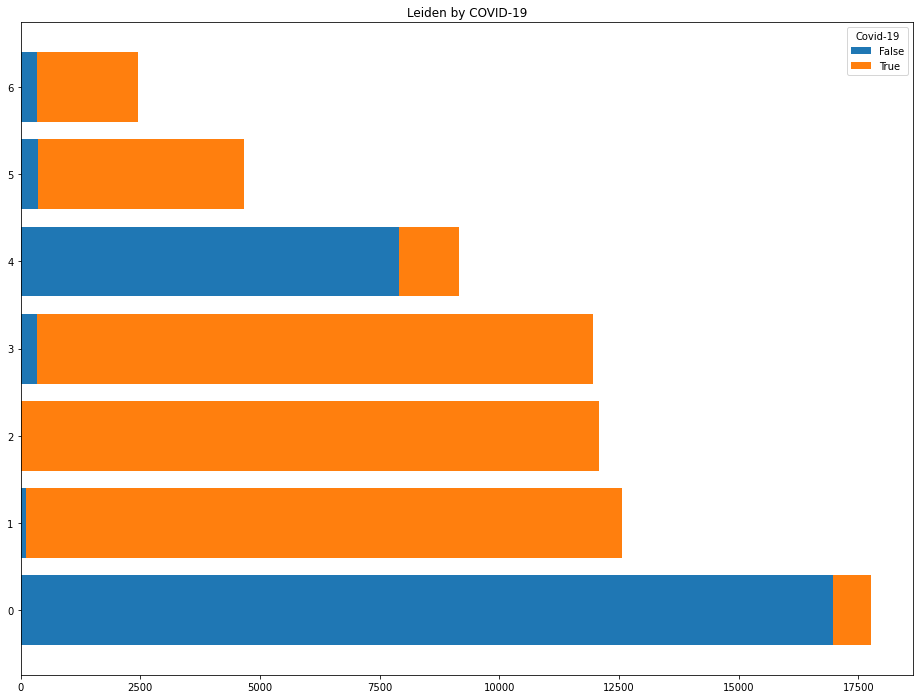

In [89]:
sc_utils.plot_composition(macs, "leiden", "COVID-19")

In [90]:
sc.tl.rank_genes_groups(macs, "leiden", method="wilcoxon", n_genes=200)
macs_markers = sc_utils.get_markers(macs, "leiden")

In [91]:
macs_markers.sort_values(
    "avg_logFC", 
    ascending=False
).groupby("cluster").head(20).sort_values(["cluster", "avg_logFC"], ascending=[True, False])

,p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
0,0.000000e+00,7.138042,0.985081,0.221716,0.000000e+00,0,FABP4
19,0.000000e+00,5.818024,0.687834,0.044063,0.000000e+00,0,HP
10,0.000000e+00,5.299847,0.846704,0.168125,0.000000e+00,0,MT-CO1
31,0.000000e+00,4.766004,0.654563,0.060150,0.000000e+00,0,HPGD
13,0.000000e+00,4.719391,0.838935,0.169789,0.000000e+00,0,MT-CO2
11,0.000000e+00,4.454940,0.766875,0.109506,0.000000e+00,0,FHL1
15,0.000000e+00,4.154063,0.952654,0.266536,0.000000e+00,0,MALAT1
113,0.000000e+00,4.138708,0.424928,0.045500,0.000000e+00,0,AOC3
7,0.000000e+00,4.062430,0.834206,0.160923,0.000000e+00,0,AC026369.3
27,0.000000e+00,3.968267,0.696504,0.111019,0.000000e+00,0,GPD1


In [92]:
macs_markers.sort_values(["cluster", "avg_logFC"], ascending=[True, False]).to_csv("03macs-markers.csv")

Cluster 0, 4 is TRAM1 (healthy TRAMs)

Cluster 1 is MoAM3 (CCL13, F13A1, FOLR2, MERTK, RNASE1, TREM2)

Cluster 2 is MoAM2 (CCL8, IL1R2, CCL7, CD38, ETV7)

Cluster 3 is MoAM4 (CCR2, CD93, VCAN, FCN1)

Cluster 5 is MoAM1 (CCL4L2, CCL3L1, CCL4, CCL2, CXCL8, CXCL2, TRAF1, CCL20, IL1B, G0S2, TNIP3, IRAK2)

Cluster 6 is TRAM2 (infected TRAMs, SEPT4, CCL23, DDX58)

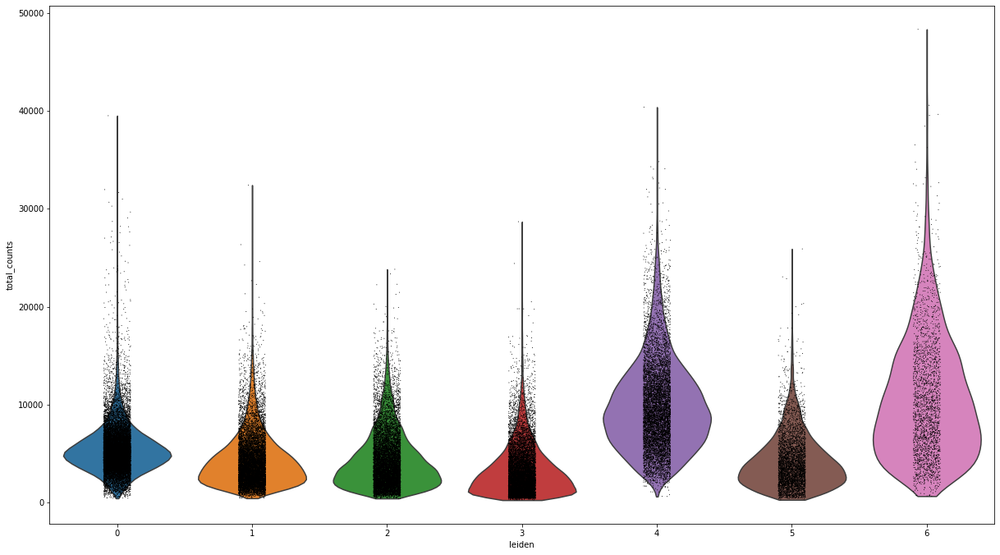

In [96]:
sc.pl.violin(macs, "total_counts", "leiden")

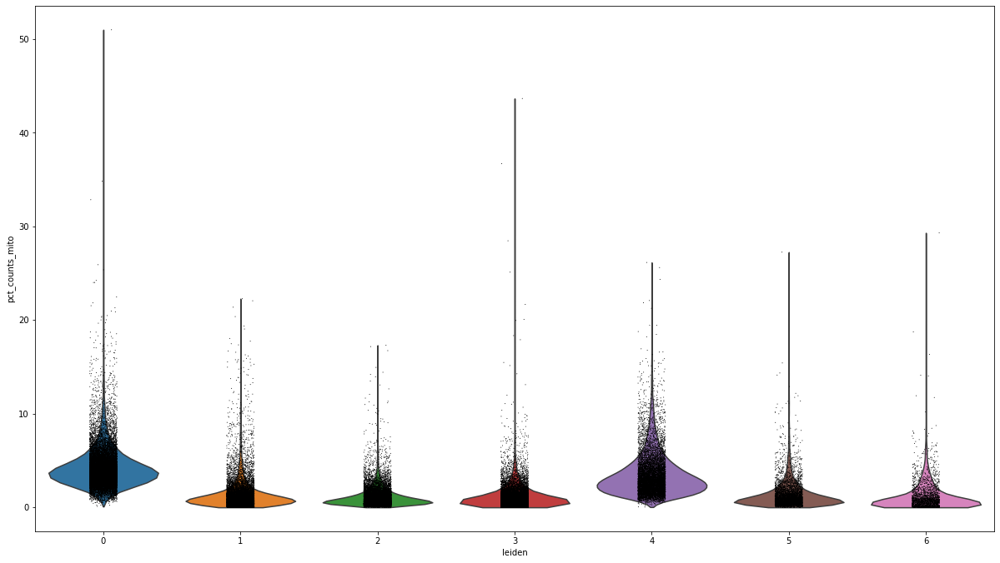

In [97]:
sc.pl.violin(macs, "pct_counts_mito", "leiden")

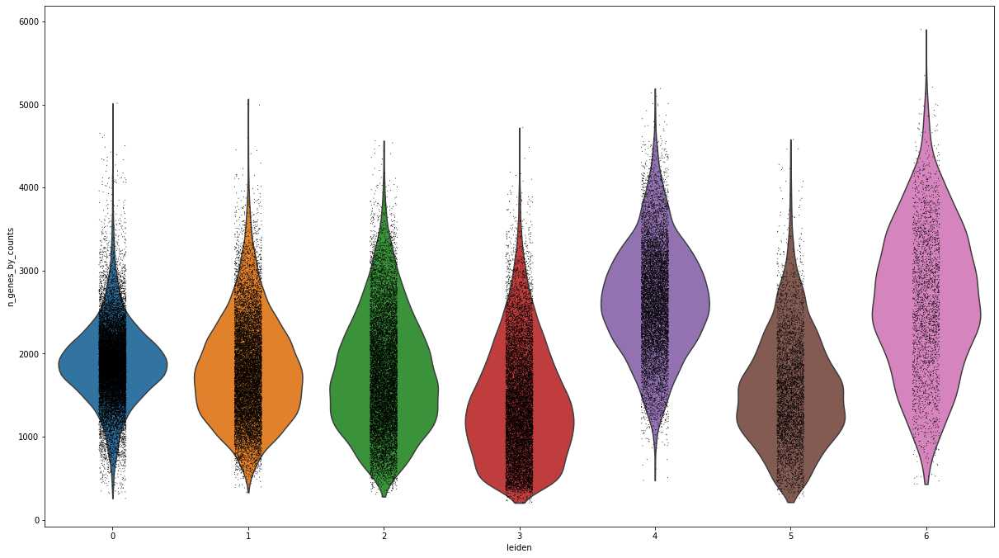

In [98]:
sc.pl.violin(macs, "n_genes_by_counts", "leiden")

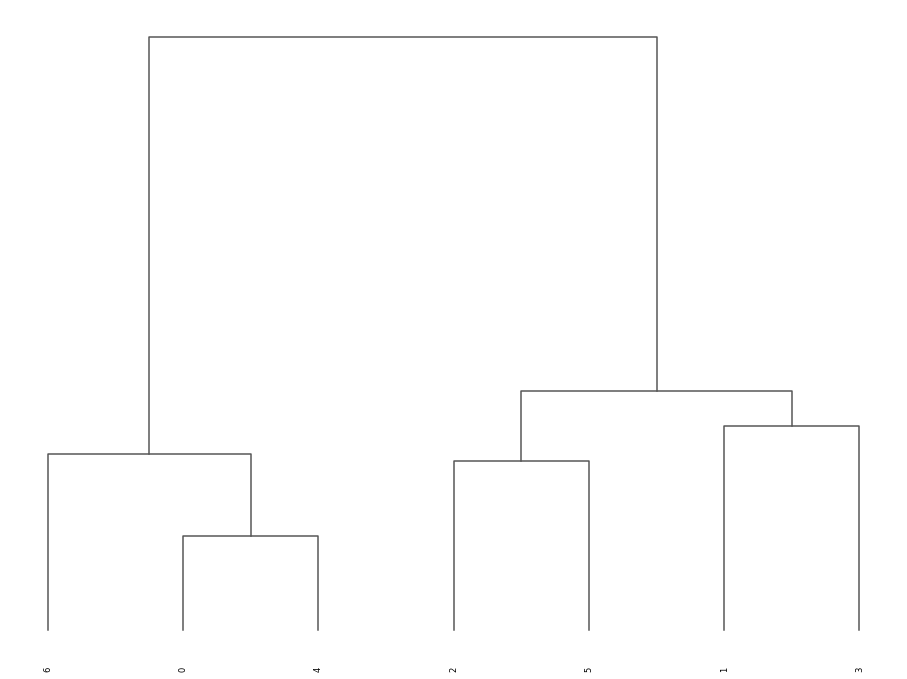

In [99]:
sc.tl.dendrogram(macs, "leiden")
sc.pl.dendrogram(macs, "leiden")

MoAM1 and MoAM4 are closer together, more immature

Set celltype for macrophages

In [31]:
names = {
    "0": "TRAM1",
    "1": "MoAM3",
    "2": "MoAM2",
    "3": "MoAM4",
    "4": "TRAM1",
    "5": "MoAM1",
    "6": "TRAM2",
}

In [32]:
macs.obs["celltype"] = macs.obs.leiden.astype(str).map(names)

In [33]:
ds.obs.celltype = ds.obs.celltype.astype(str)
ds.obs.loc[macs.obs.index, "celltype"] = macs.obs.celltype
ds.obs.celltype = ds.obs.celltype.astype("category")

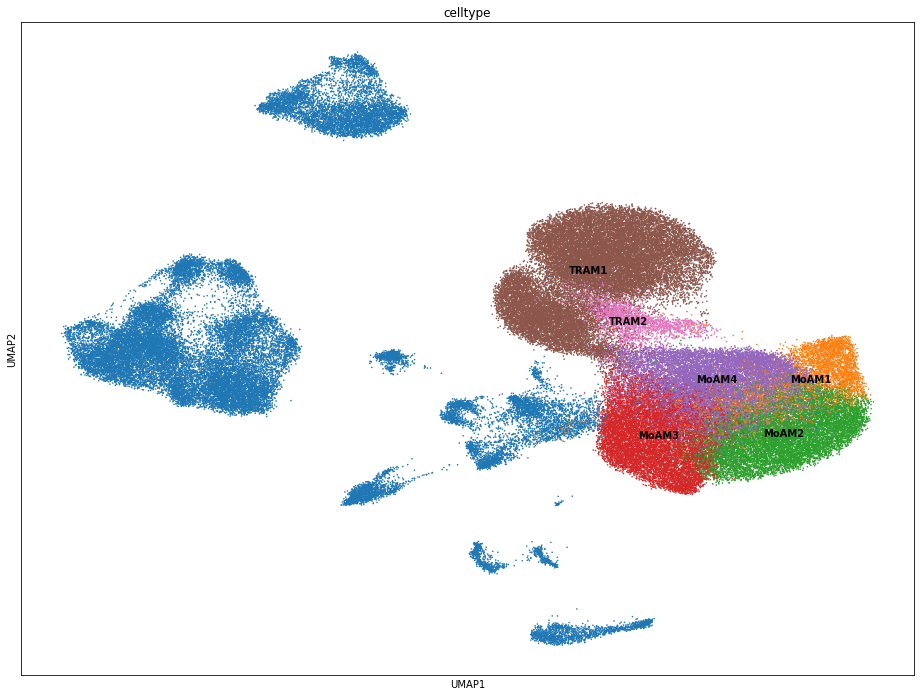

In [34]:
sc.pl.umap(ds, color="celltype", size=10, legend_loc="on data")

## 2. Subcluster T cells

In [35]:
tcells = ds[ds.obs.leiden.isin(["4", "5", "10"]), :]

In [36]:
tcells = tcells.raw.to_adata()

In [37]:
sc.pp.highly_variable_genes(tcells, n_top_genes=2000, batch_key="orig.ident")

In [38]:
tcells.var.highly_variable[tcells.var_names.str.match("^SARS-CoV-2")] = False

/projects/b1038/Pulmonary/nmarkov/script/code/.venv/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [39]:
tcells.raw = tcells

In [40]:
sc.pp.scale(tcells)
sc.tl.pca(tcells, svd_solver="arpack")

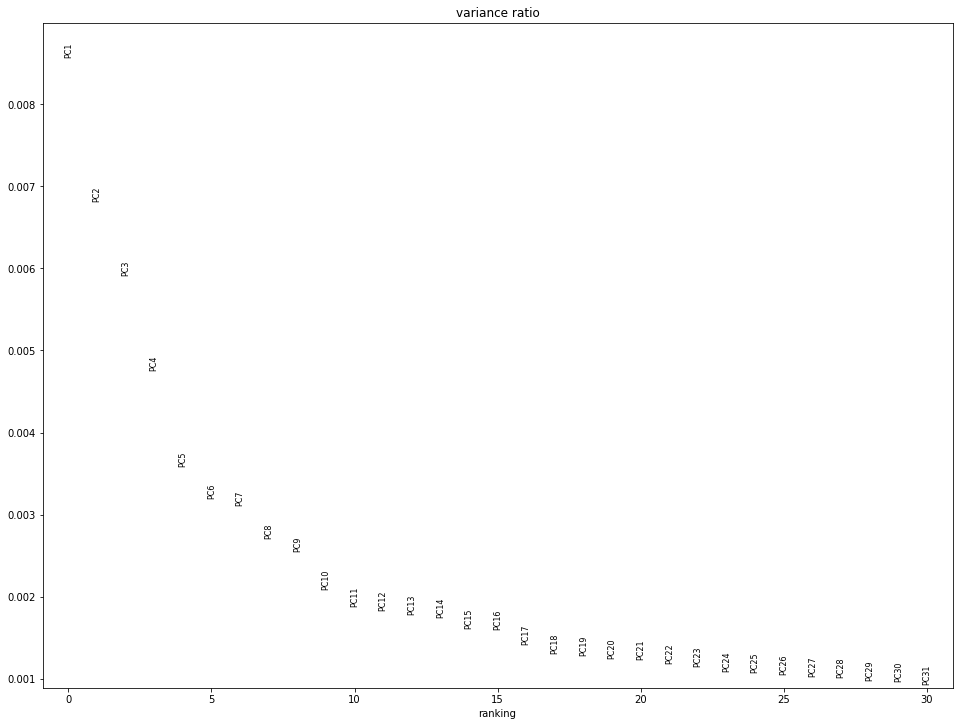

In [41]:
sc.pl.pca_variance_ratio(tcells)

In [42]:
bbknn.bbknn(tcells, neighbors_within_batch=int(100 / tcells.obs.batch.unique().size), n_pcs=26)

In [43]:
sc.tl.leiden(tcells, resolution=1.7)

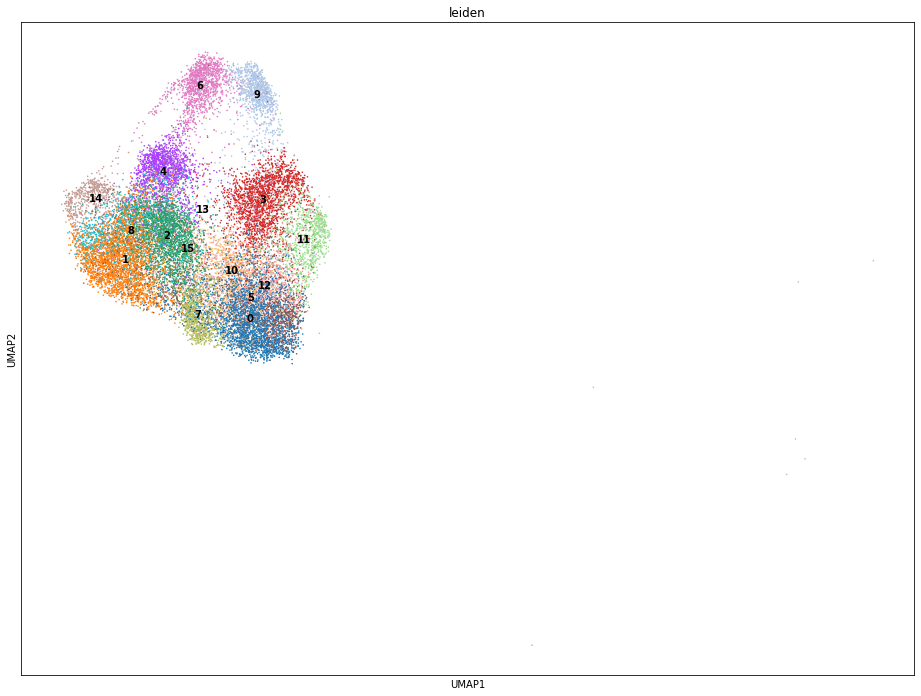

In [44]:
sc.pl.umap(tcells, color="leiden", size=10, legend_loc="on data")

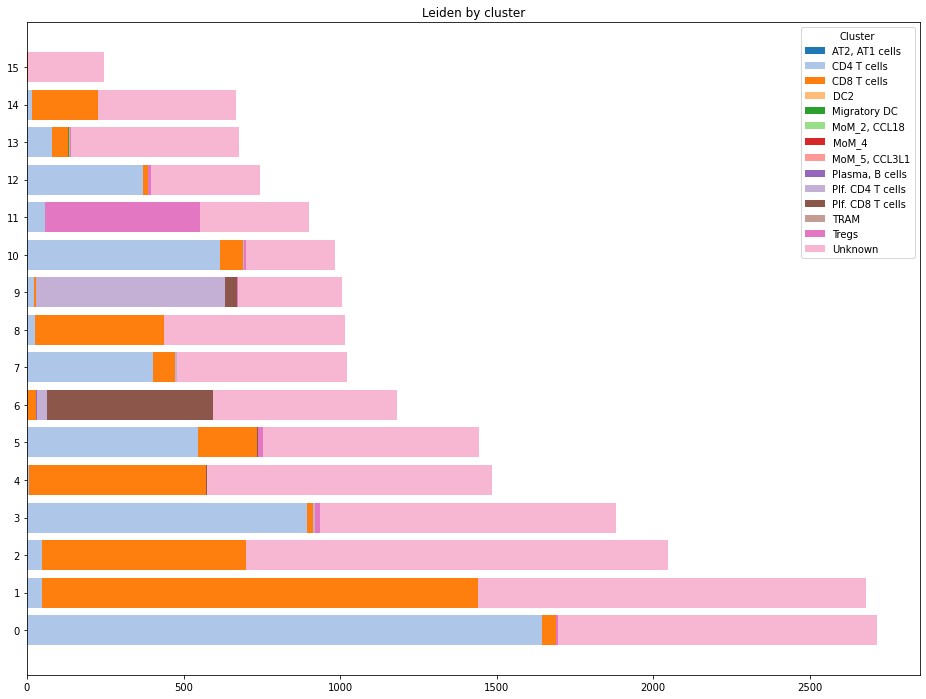

In [121]:
sc_utils.plot_composition(tcells, "leiden", "cluster")

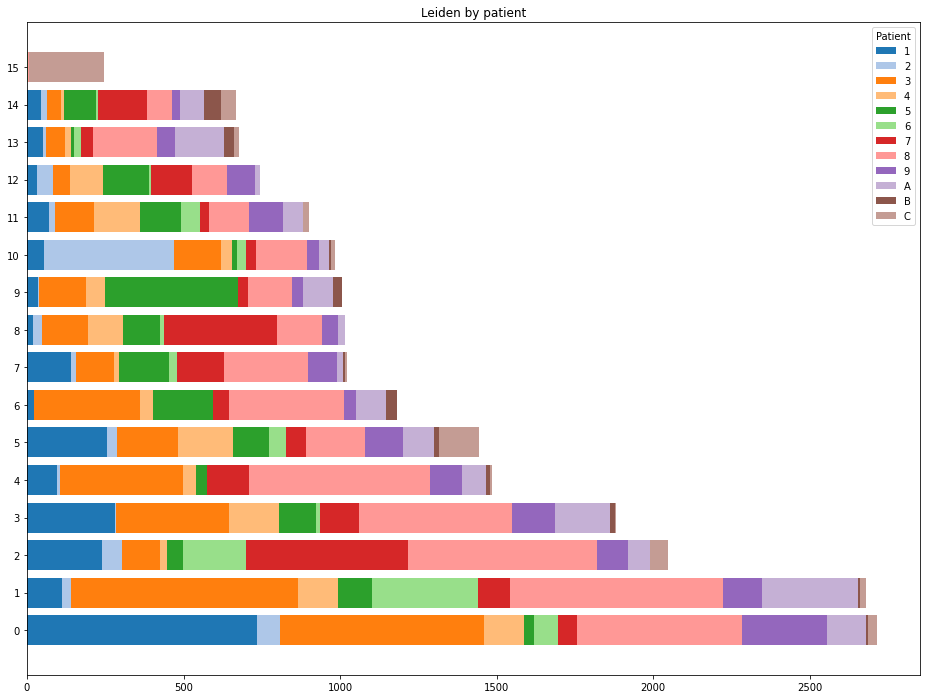

In [68]:
sc_utils.plot_composition(tcells, "leiden", "patient")

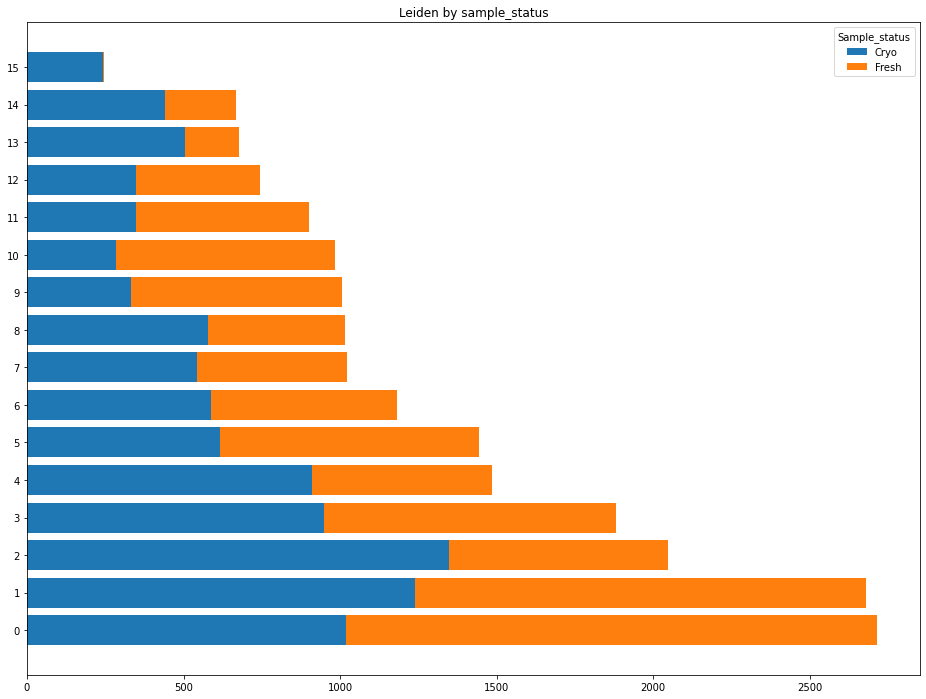

In [123]:
sc_utils.plot_composition(tcells, "leiden", "sample_status")

In [124]:
sc.tl.rank_genes_groups(tcells, "leiden", method="wilcoxon", n_genes=200)
tcells_markers = sc_utils.get_markers(tcells, "leiden")

In [125]:
tcells_markers.sort_values(
    "avg_logFC", 
    ascending=False
).groupby("cluster").head(20).sort_values(["cluster", "avg_logFC"], ascending=[True, False])

,p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
91,1.859877e-39,3.440961,0.182320,0.023236,1.859877e-39,0,MAL
3,0.000000e+00,3.270736,0.903499,0.388904,0.000000e+00,0,IL7R
57,2.903614e-149,2.977965,0.386372,0.080716,2.903614e-149,0,CCR7
89,8.228422e-42,2.719834,0.202578,0.037856,8.228422e-42,0,TCF7
9,0.000000e+00,2.715227,0.825046,0.406415,0.000000e+00,0,LTB
101,1.145521e-29,2.450249,0.183425,0.047918,1.145521e-29,0,FBLN7
99,1.442455e-30,2.072128,0.206630,0.069487,1.442455e-30,0,S1PR1
125,5.189907e-17,2.065554,0.154696,0.053255,5.189907e-17,0,LEF1
78,3.303773e-78,1.995929,0.353959,0.141753,3.303773e-78,0,KLF2
194,5.648568e-06,1.957680,0.095396,0.036856,5.648568e-06,0,PASK


In [126]:
tcells_markers.sort_values(["cluster", "avg_logFC"], ascending=[True, False]).to_csv("03tcells-markers.csv")

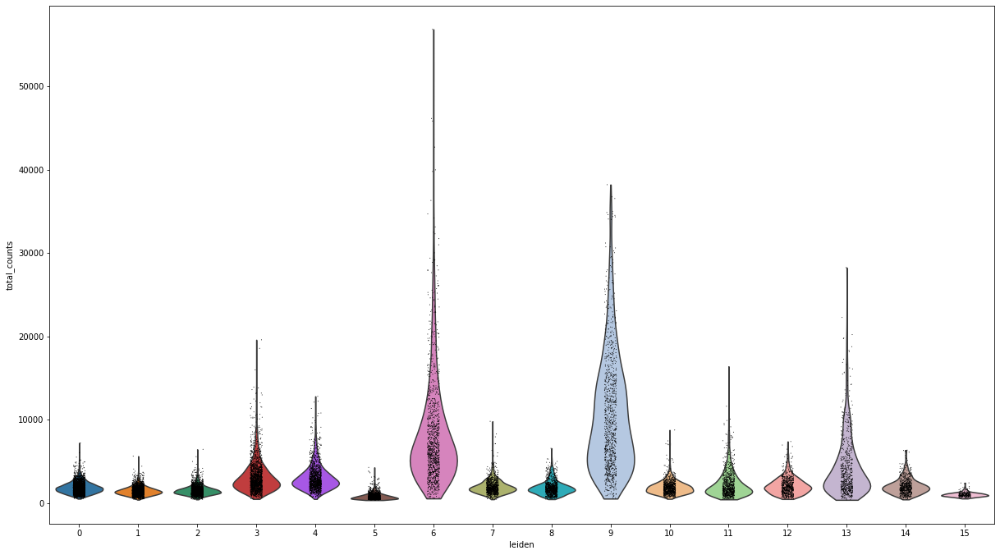

In [127]:
sc.pl.violin(tcells, "total_counts", "leiden")

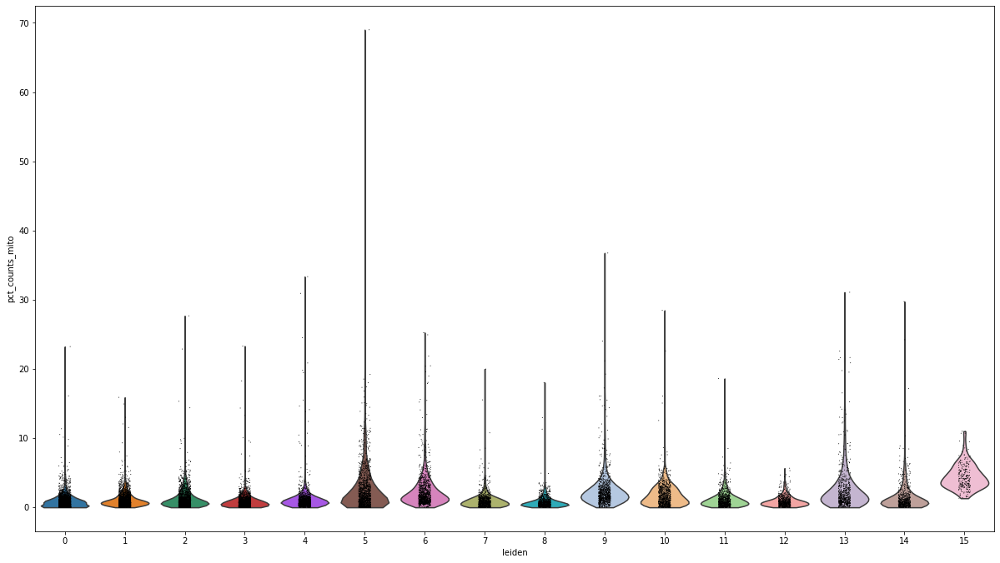

In [128]:
sc.pl.violin(tcells, "pct_counts_mito", "leiden")

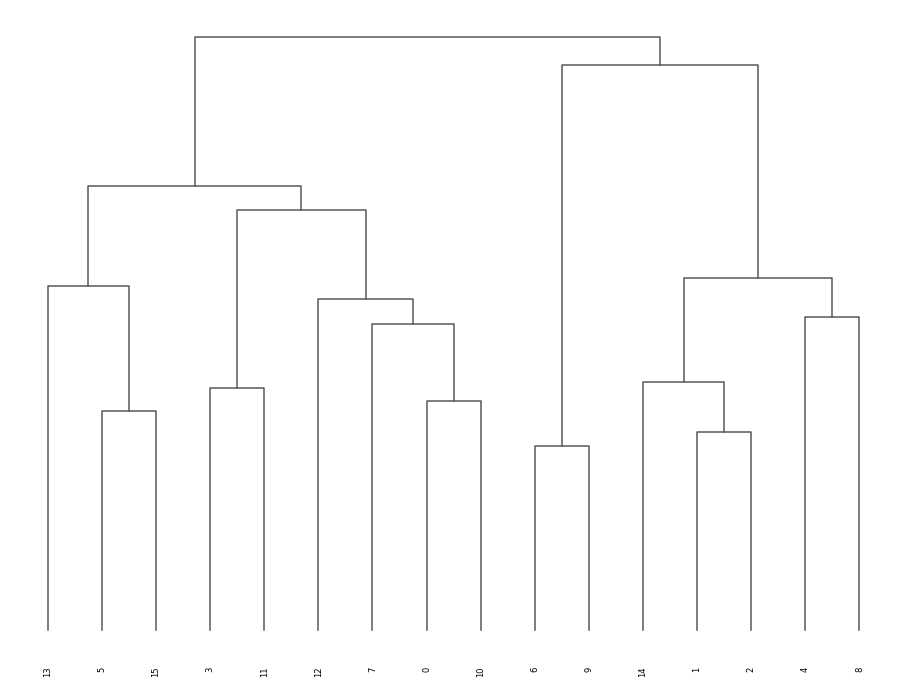

In [129]:
sc.tl.dendrogram(tcells, "leiden")
sc.pl.dendrogram(tcells, "leiden")

In [46]:
names = {
    "0": "CD4 CM T cells",
    "1": "CD8 cytotoxic T cells",
    "2": "CD8 cytotoxic TRM T cells",
    "3": "CD4 cytotoxic T cells",
    "4": "CD8 cytotoxic TRM T cells",
    "5": "CD4 CM T cells",
    "6": "CD8 proliferating T cells",
    "7": "iNKT cells",
    "8": "CD8 cytotoxic T cells",
    "9": "CD4 proliferating T cells",
    "10": "CD4 CM T cells",
    "11": "Treg",
    "12": "CD4 CM T cells",
    "13": "CD8 cytotoxic T cells",
    "14": "CD8 cytotoxic T cells",
    "15": "CD8 cytotoxic T cells",
}

In [47]:
tcells.obs["celltype"] = tcells.obs.leiden.astype(str).map(names)

In [48]:
ds.obs.celltype = ds.obs.celltype.astype(str)
ds.obs.loc[tcells.obs.index, "celltype"] = tcells.obs.celltype
ds.obs.celltype = ds.obs.celltype.astype("category")

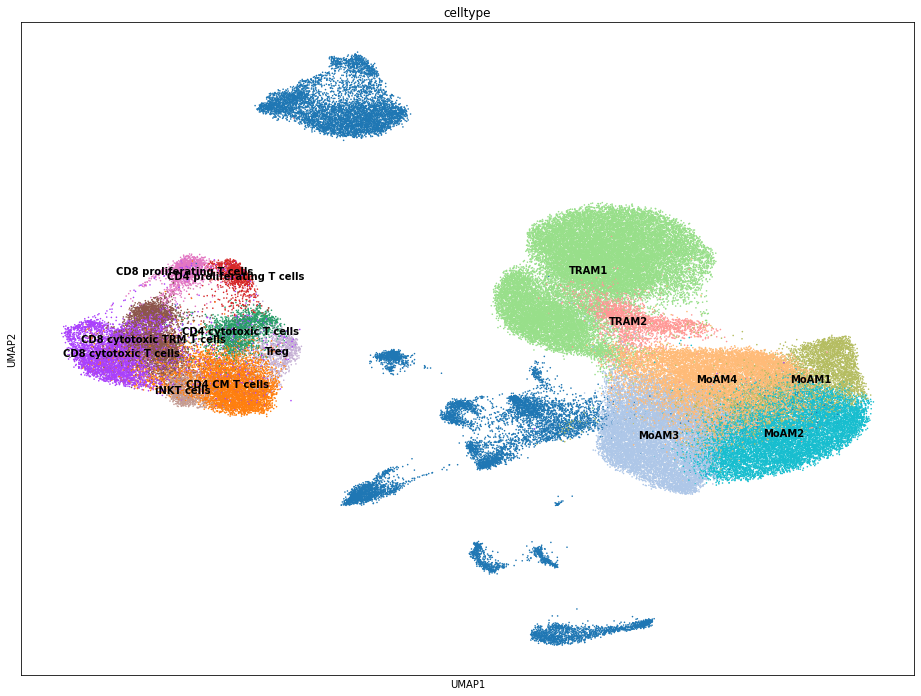

In [49]:
sc.pl.umap(ds, color="celltype", size=10, legend_loc="on data")

## 3. Subcluster DCs

In [50]:
dcs = ds[ds.obs.leiden == "8", :].copy()

In [51]:
dcs = dcs.raw.to_adata()

In [52]:
sc.pp.highly_variable_genes(dcs, n_top_genes=1500, batch_key="orig.ident")

In [53]:
dcs.var.highly_variable[dcs.var_names.str.match("^SARS-CoV-2")] = False

/projects/b1038/Pulmonary/nmarkov/script/code/.venv/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [54]:
dcs.raw = dcs

In [55]:
sc.pp.scale(dcs)
sc.tl.pca(dcs, svd_solver="arpack")

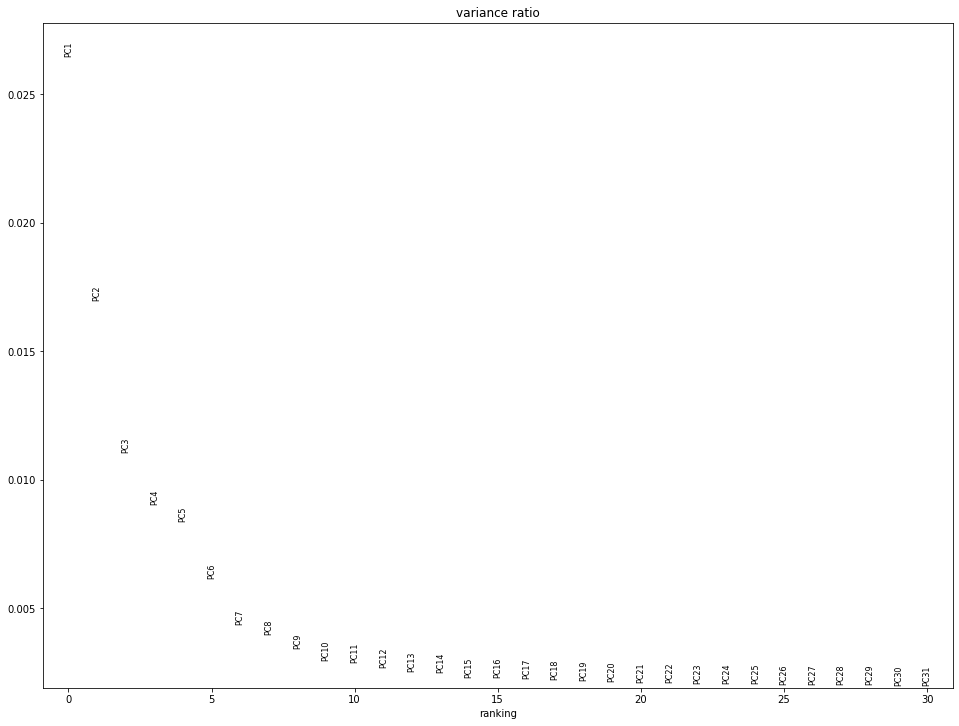

In [56]:
sc.pl.pca_variance_ratio(dcs)

In [57]:
bbknn.bbknn(dcs, neighbors_within_batch=int(100 / dcs.obs.batch.unique().size), n_pcs=14)

In [58]:
sc.tl.leiden(dcs, resolution=0.5)

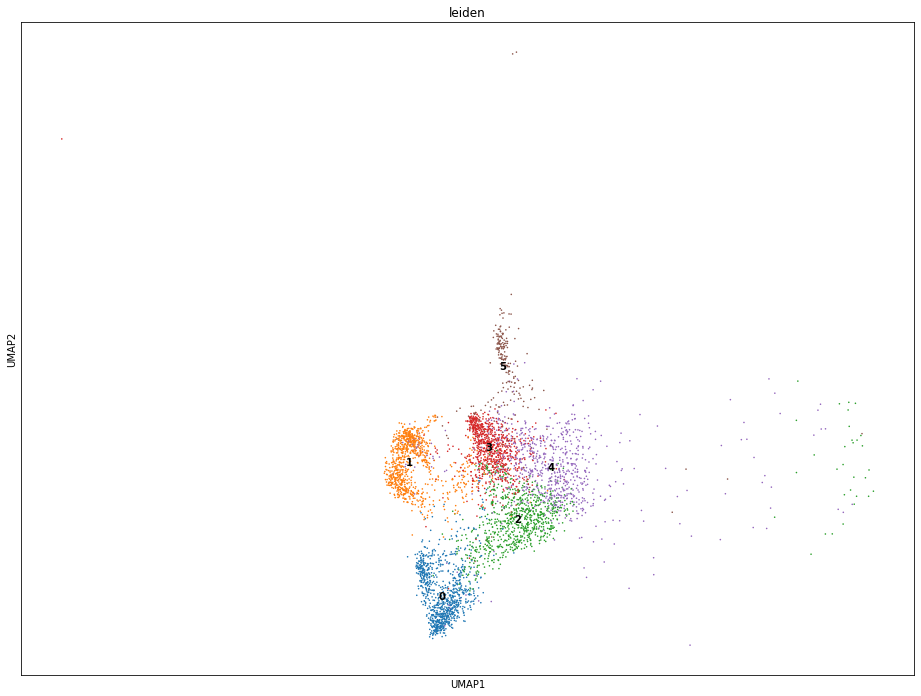

In [59]:
sc.pl.umap(dcs, color="leiden", size=10, legend_loc="on data")

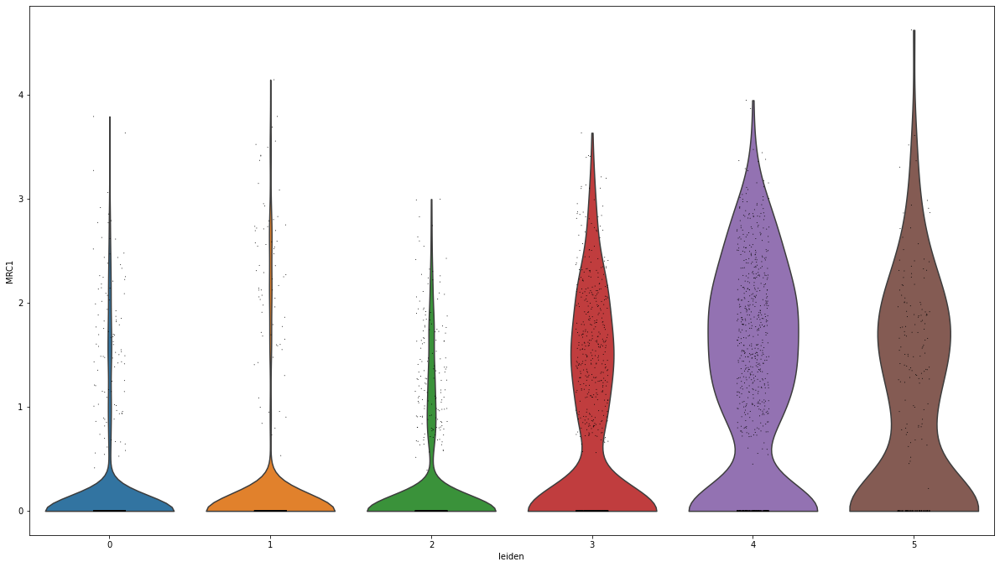

In [216]:
sc.pl.violin(dcs, "MRC1", "leiden")

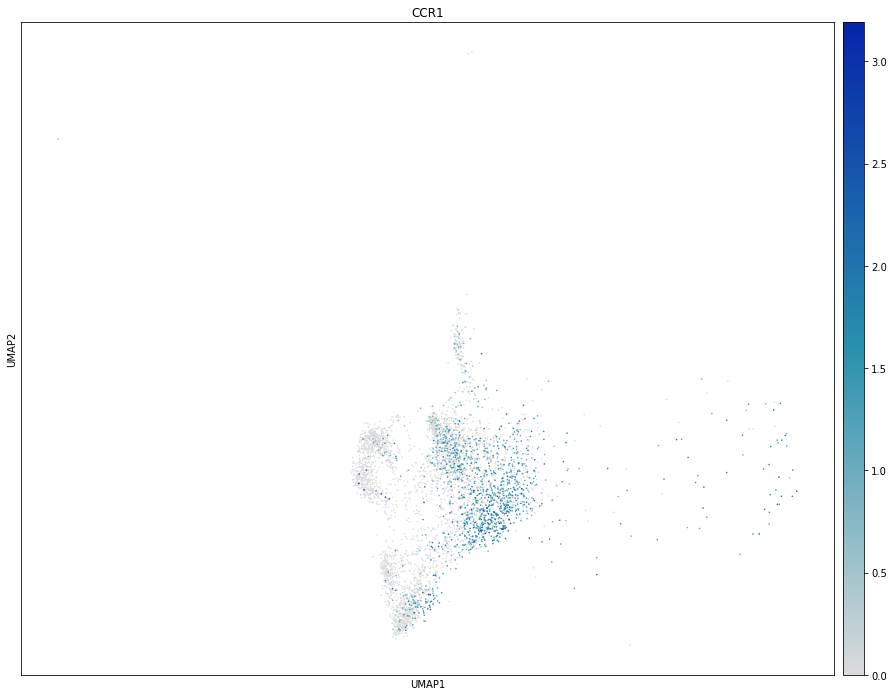

In [217]:
sc.pl.umap(dcs, color="CCR1", size=10, cmap=sc_utils.expr_colormap())

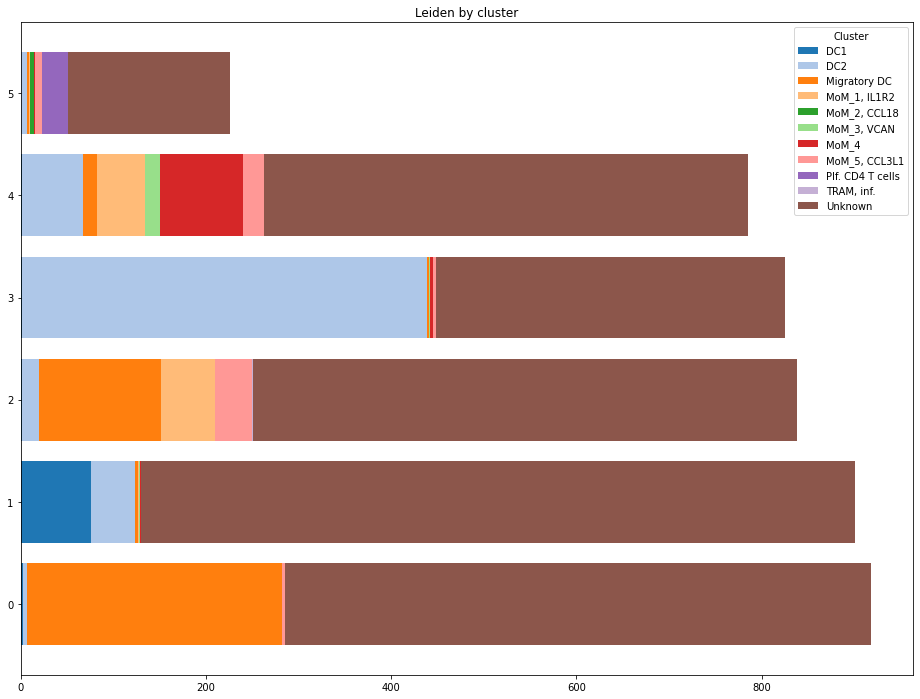

In [193]:
sc_utils.plot_composition(dcs, "leiden", "cluster")

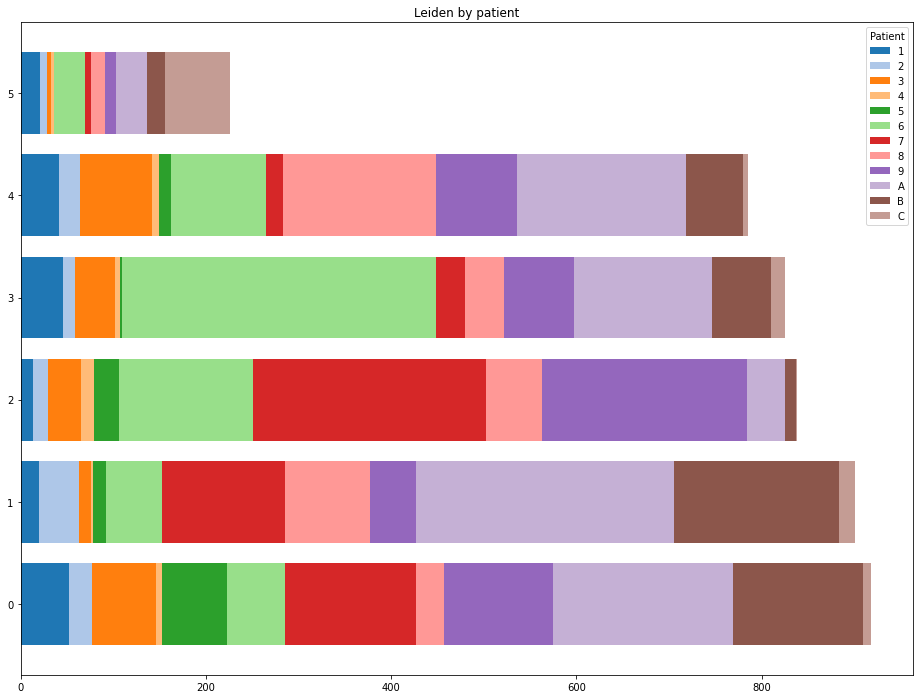

In [67]:
sc_utils.plot_composition(dcs, "leiden", "patient")

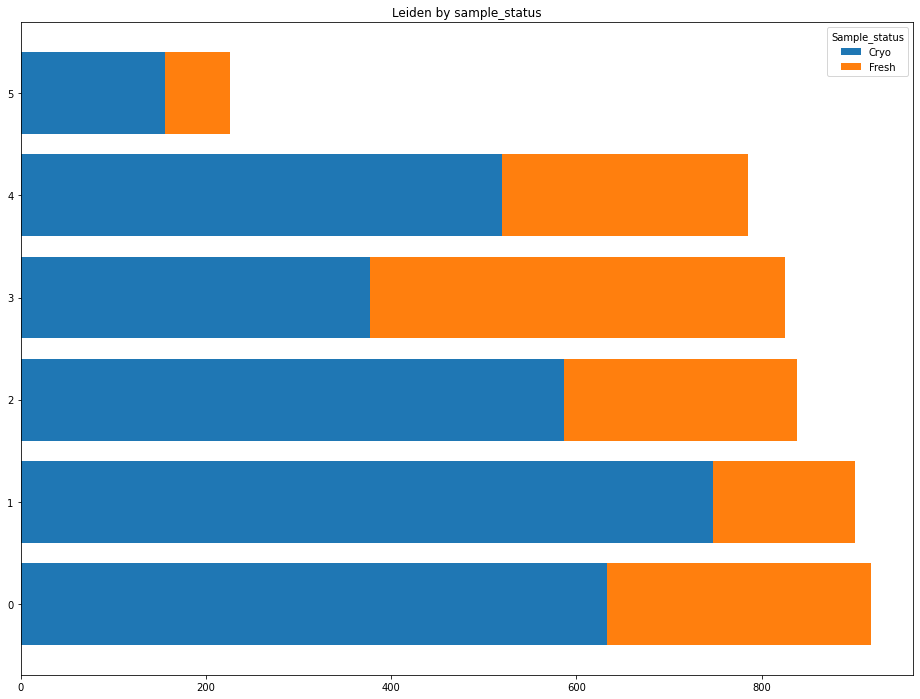

In [195]:
sc_utils.plot_composition(dcs, "leiden", "sample_status")

In [196]:
sc.tl.rank_genes_groups(dcs, "leiden", method="wilcoxon", n_genes=200)
dcs_markers = sc_utils.get_markers(dcs, "leiden")

In [197]:
dcs_markers.sort_values(
    "avg_logFC", 
    ascending=False
).groupby("cluster").head(20).sort_values(["cluster", "avg_logFC"], ascending=[True, False])

,p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
12,3.099244e-178,7.583350,0.623094,0.014825,3.099244e-178,0,CCL19
19,4.857891e-137,6.811177,0.546841,0.012587,4.857891e-137,0,LAD1
143,4.733902e-28,6.786576,0.245098,0.003636,4.733902e-28,0,ACHE
2,2.608384e-287,6.176095,0.810458,0.102378,2.608384e-287,0,FSCN1
77,1.033261e-51,6.074506,0.337691,0.009790,1.033261e-51,0,LIMCH1
0,0.000000e+00,5.662819,0.924837,0.202238,0.000000e+00,0,BIRC3
165,1.486755e-22,5.482462,0.223312,0.007832,1.486755e-22,0,HMSD
87,7.615970e-46,5.414895,0.322440,0.014825,7.615970e-46,0,CD200
68,1.772884e-60,5.323841,0.372549,0.019301,1.772884e-60,0,ANKRD33B
48,6.786799e-85,4.878476,0.446623,0.028811,6.786799e-85,0,SLCO5A1


In [198]:
dcs_markers.sort_values(["cluster", "avg_logFC"], ascending=[True, False]).to_csv("03dcs-markers.csv")

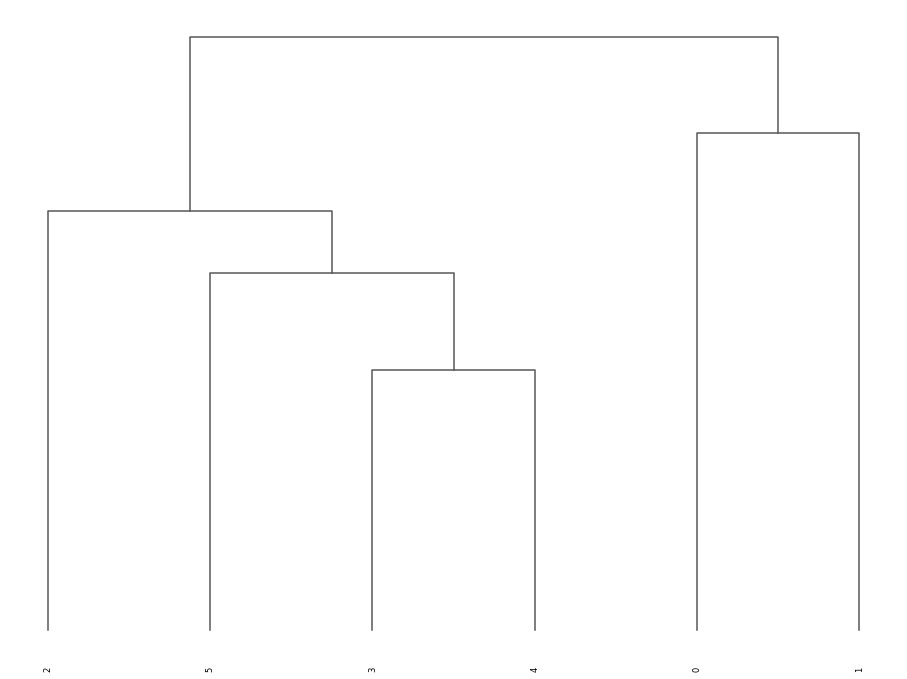

In [199]:
sc.tl.dendrogram(dcs, "leiden")
sc.pl.dendrogram(dcs, "leiden")

Cluster 0 is migratory DCs (CCL19, CCR7, BIRC3)

Cluster 1 is DC1 (CLEC9A, XCR1)

Cluster 2 is Mixed myeloid (APOBEC3A, CXCL11, CCL4L2, GPR35) — similar IFNg response signature to MoAM1 (IL1B, CXCL10, IL1RN, IFI*, ISG*)

Cluster 3 is DC2 (CD1C, CD1E, PKIB)

Cluster 4 is Mixed myeloid (CD14)

Cluster 5 is Proliferating AM

In [70]:
names = {
    "0": "Migratory DC",
    "1": "DC1",
    "2": "Mixed myeloid",
    "3": "DC2",
    "4": "Mixed myeloid",
    "5": "Proliferating AM",
}

In [71]:
dcs.obs.celltype = dcs.obs.celltype.astype(str)
dcs.obs.celltype = dcs.obs.leiden.astype(str).map(names)
dcs.obs.celltype = dcs.obs.celltype.astype("category")

In [72]:
ds.obs.celltype = ds.obs.celltype.astype(str)
ds.obs.loc[dcs.obs.index, "celltype"] = dcs.obs.celltype
ds.obs.celltype = ds.obs.celltype.astype("category")

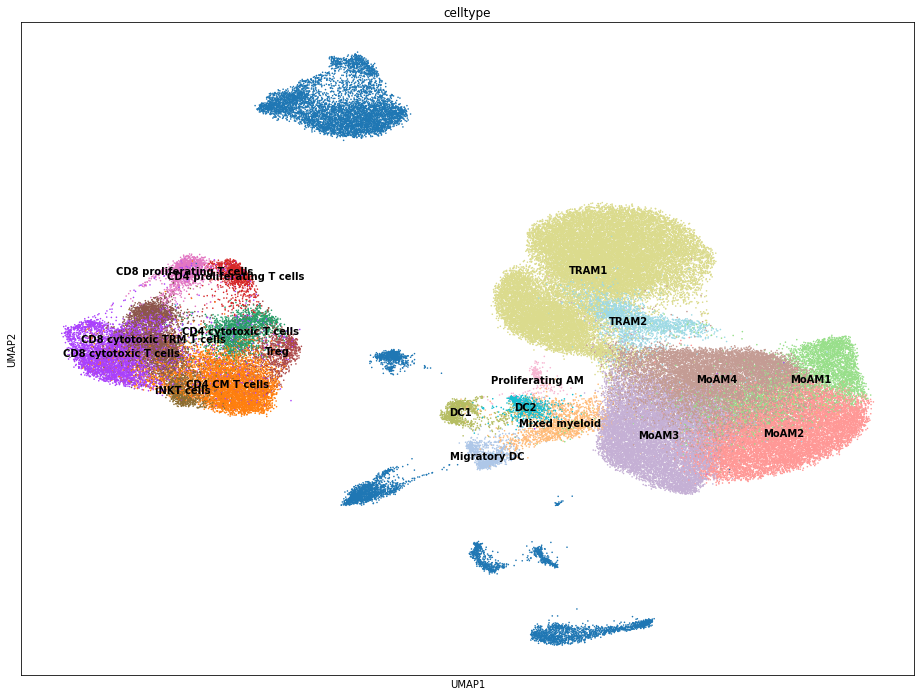

In [73]:
sc.pl.umap(ds, color="celltype", size=10, legend_loc="on data")

## 4. Subclustering epithelial cells

In [74]:
c13 = ds[ds.obs.leiden.isin(["13"]), :]

In [75]:
c13 = c13.raw.to_adata()

In [76]:
sc.pp.highly_variable_genes(c13, n_top_genes=1500, batch_key="orig.ident")

/projects/b1038/Pulmonary/nmarkov/script/code/.venv/lib/python3.6/site-packages/scanpy/preprocessing/_highly_variable_genes.py:84: RuntimeWarning: divide by zero encountered in true_divide
  ) / disp_std_bin[df['mean_bin'].values].values


In [77]:
c13.var.highly_variable[c13.var_names.str.match("^SARS-CoV-2")] = False

/projects/b1038/Pulmonary/nmarkov/script/code/.venv/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [78]:
c13.raw = c13

In [79]:
sc.pp.scale(c13)
sc.tl.pca(c13, svd_solver="arpack")

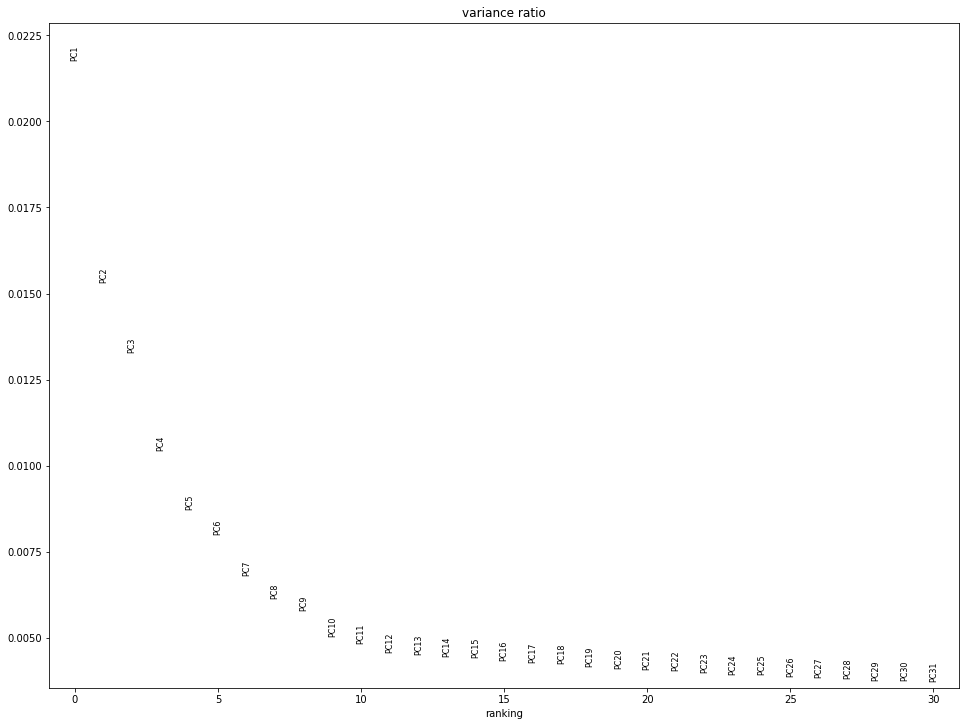

In [80]:
sc.pl.pca_variance_ratio(c13)

In [81]:
bbknn.bbknn(c13, neighbors_within_batch=int(40 / c13.obs.batch.unique().size), n_pcs=11)

In [82]:
sc.tl.leiden(c13, resolution=0.4)

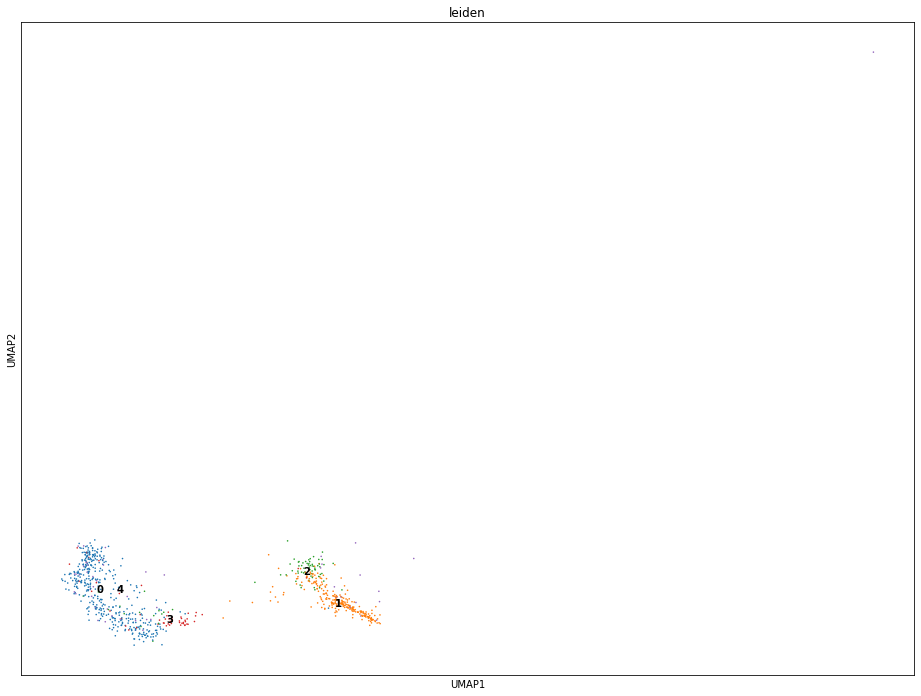

In [83]:
sc.pl.umap(c13, color="leiden", size=10, legend_loc="on data")

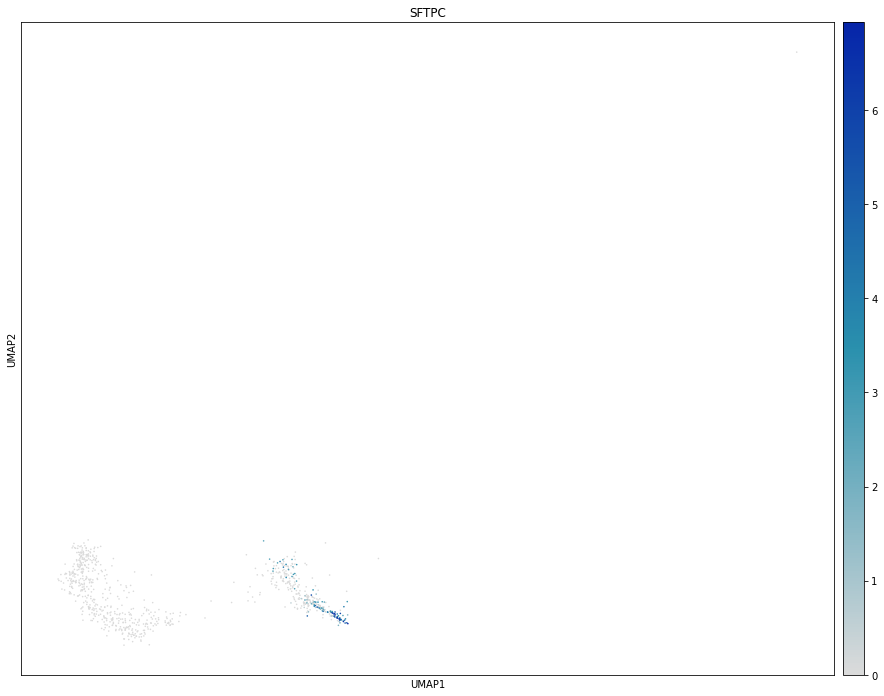

In [84]:
sc.pl.umap(c13, color="SFTPC", size=10, cmap=sc_utils.expr_colormap())

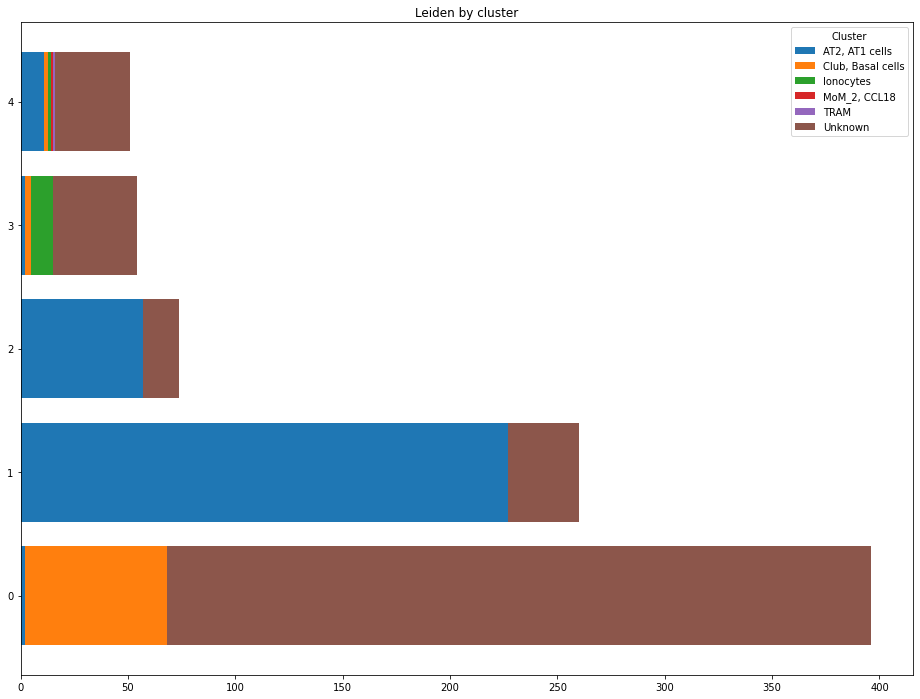

In [244]:
sc_utils.plot_composition(c13, "leiden", "cluster")

In [245]:
sc.tl.rank_genes_groups(c13, "leiden", method="wilcoxon", n_genes=200)
c13_markers = sc_utils.get_markers(c13, "leiden")

In [246]:
c13_markers.sort_values(
    "avg_logFC", 
    ascending=False
).groupby("cluster").head(20).sort_values(["cluster", "avg_logFC"], ascending=[True, False])

,p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
1,5.414316e-74,5.636670,0.830808,0.123007,5.414316e-74,0,SERPINB3
5,1.562173e-55,5.565095,0.755051,0.193622,1.562173e-55,0,SCGB3A1
6,5.952799e-55,5.452036,0.717172,0.109339,5.952799e-55,0,MSMB
10,2.319295e-44,5.443172,0.666667,0.104784,2.319295e-44,0,SCGB1A1
152,3.894366e-07,5.357155,0.247475,0.015945,3.894366e-07,0,BPIFA1
29,1.392769e-30,5.223161,0.525253,0.056948,1.392769e-30,0,BPIFB1
118,2.186823e-09,5.201668,0.285354,0.020501,2.186823e-09,0,MUC5AC
0,1.761131e-76,4.873223,0.921717,0.492027,1.761131e-76,0,SLPI
94,8.559553e-13,4.711060,0.333333,0.022779,8.559553e-13,0,NTS
104,1.427515e-10,4.410577,0.308081,0.027335,1.427515e-10,0,CDC42EP5


In [247]:
c13_markers.sort_values(["cluster", "avg_logFC"], ascending=[True, False]).to_csv("03c13-markers.csv")

Cluster 0 is Club/Basal cells (SCGB3A1, MUC5B)

Cluster 1 is AT2/AT1 (SFTP*, HOPX, SPOCK2)

Cluster 2 is Infected AT2/AT1 (SPOCK2, SFTPC)

Cluster 3 is Ionocytes (FOXI1)

Cluster 4 is doublets: removing

In [85]:
c13 = c13[c13.obs.leiden != "4", :]

In [86]:
names = {
    "0": "Club, Basal cells",
    "1": "AT2, AT1 cells",
    "2": "Infected AT2, AT1 cells",
    "3": "Ionocytes",
}

In [87]:
c13.obs.celltype = c13.obs.celltype.astype(str)
c13.obs.celltype = c13.obs.leiden.astype(str).map(names)
c13.obs.celltype = c13.obs.celltype.astype("category")

Trying to set attribute `.obs` of view, copying.


In [88]:
ds.obs.celltype = ds.obs.celltype.astype(str)
ds.obs.loc[c13.obs.index, "celltype"] = c13.obs.celltype
ds.obs.celltype = ds.obs.celltype.astype("category")

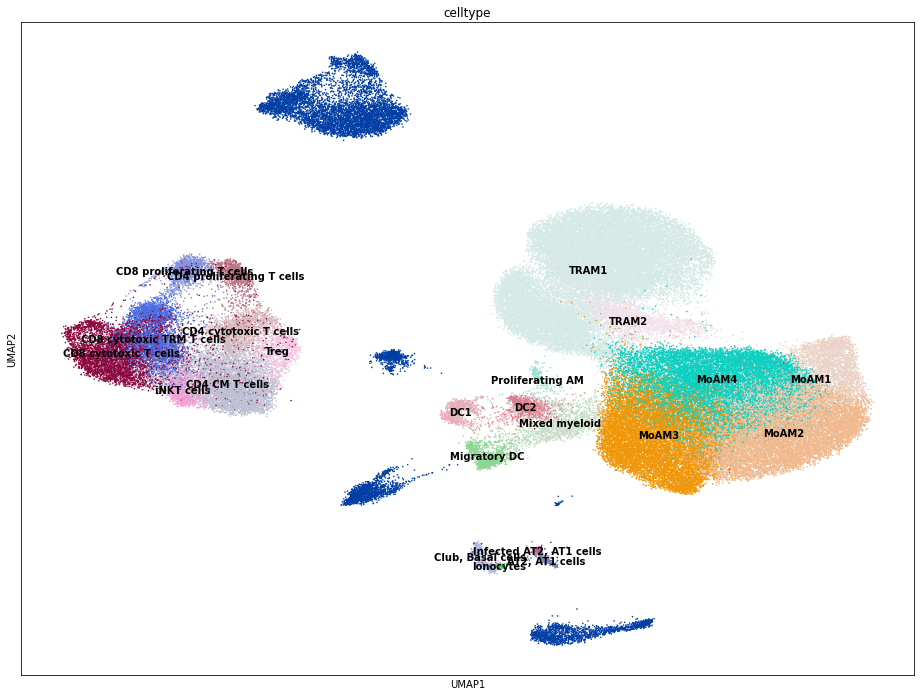

In [89]:
sc.pl.umap(ds, color="celltype", size=10, legend_loc="on data")

## 5. Name remaining clusters

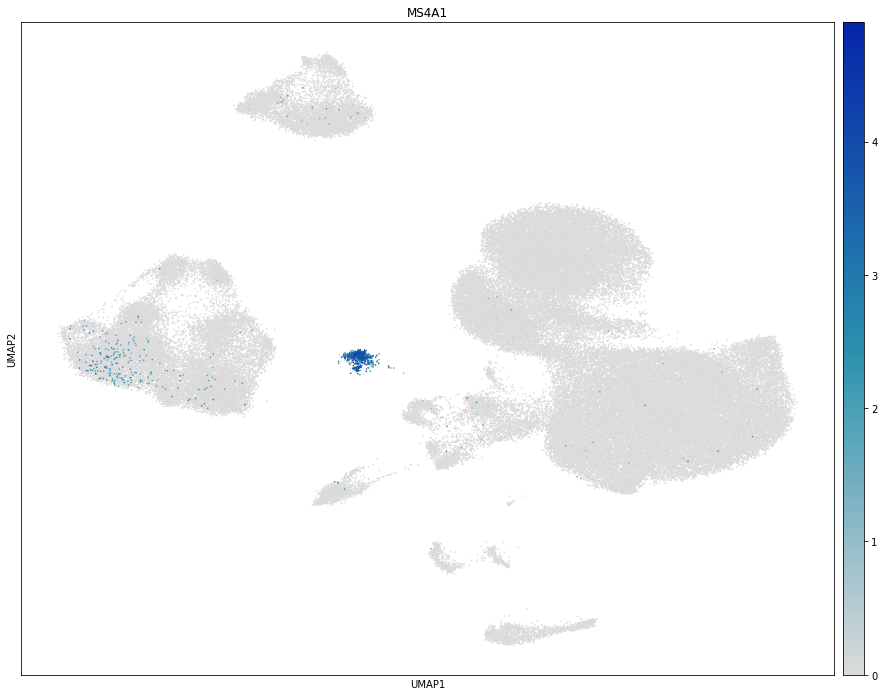

In [264]:
sc.pl.umap(ds, color="MS4A1", size=10, cmap=sc_utils.expr_colormap())

In [90]:
remaining = ds.obs.leiden.isin(["7", "11", "12", "14", "15"])
remaining_names = {
    "7": "Plasma cells",
    "11": "Ciliated cells",
    "12": "pDC",
    "14": "B cells",
    "15": "Mast cells",
}

In [91]:
ds.obs.celltype = ds.obs.celltype.astype(str)
ds.obs.loc[remaining, "celltype"] = ds.obs.leiden[remaining].astype(str).map(remaining_names)
ds.obs.celltype = ds.obs.celltype.astype("category")

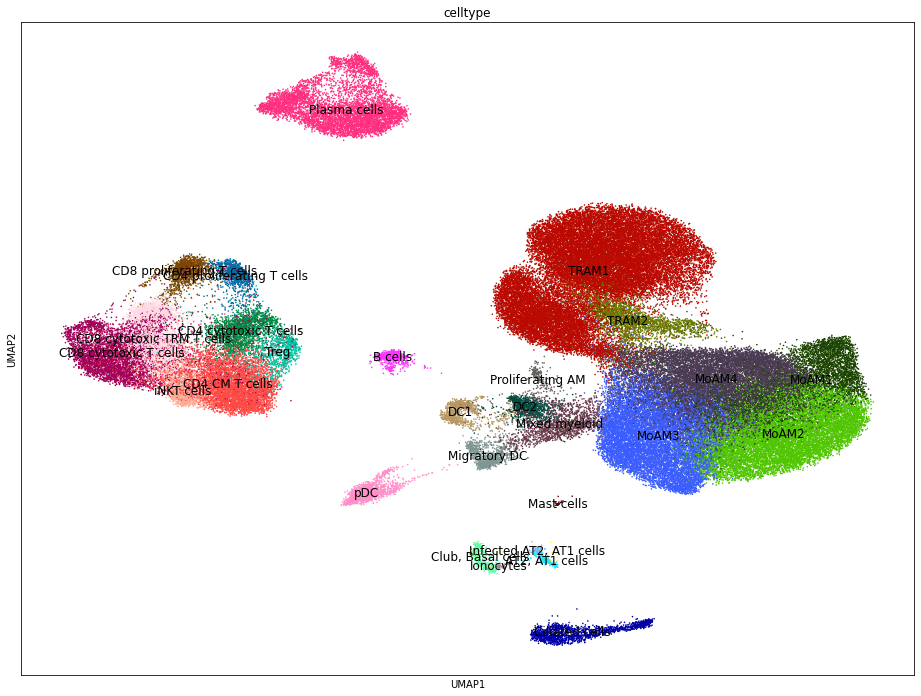

In [92]:
sc.pl.umap(
    ds, 
    color="celltype", 
    size=10, 
    legend_loc="on data",
#     legend_fontoutline=3,
    legend_fontweight="normal",
    legend_fontsize=12
)

In [273]:
ds.obs.to_csv("03metadata.csv")

In [274]:
sc.tl.rank_genes_groups(ds, "celltype", method="wilcoxon", n_genes=200)
markers = sc_utils.get_markers(ds, "celltype")

../lib/script/scanpy.py:41: RuntimeWarning: invalid value encountered in long_scalars
  return (anndata.raw[:, gene].X.todense()[cells, :].A.reshape(-1) > 0).sum() / cells.sum()
../lib/script/scanpy.py:41: RuntimeWarning: invalid value encountered in long_scalars
  return (anndata.raw[:, gene].X.todense()[cells, :].A.reshape(-1) > 0).sum() / cells.sum()
../lib/script/scanpy.py:41: RuntimeWarning: invalid value encountered in long_scalars
  return (anndata.raw[:, gene].X.todense()[cells, :].A.reshape(-1) > 0).sum() / cells.sum()
../lib/script/scanpy.py:41: RuntimeWarning: invalid value encountered in long_scalars
  return (anndata.raw[:, gene].X.todense()[cells, :].A.reshape(-1) > 0).sum() / cells.sum()
../lib/script/scanpy.py:41: RuntimeWarning: invalid value encountered in long_scalars
  return (anndata.raw[:, gene].X.todense()[cells, :].A.reshape(-1) > 0).sum() / cells.sum()
../lib/script/scanpy.py:41: RuntimeWarning: invalid value encountered in long_scalars
  return (anndata.raw[:,

../lib/script/scanpy.py:41: RuntimeWarning: invalid value encountered in long_scalars
  return (anndata.raw[:, gene].X.todense()[cells, :].A.reshape(-1) > 0).sum() / cells.sum()
../lib/script/scanpy.py:41: RuntimeWarning: invalid value encountered in long_scalars
  return (anndata.raw[:, gene].X.todense()[cells, :].A.reshape(-1) > 0).sum() / cells.sum()
../lib/script/scanpy.py:41: RuntimeWarning: invalid value encountered in long_scalars
  return (anndata.raw[:, gene].X.todense()[cells, :].A.reshape(-1) > 0).sum() / cells.sum()
../lib/script/scanpy.py:41: RuntimeWarning: invalid value encountered in long_scalars
  return (anndata.raw[:, gene].X.todense()[cells, :].A.reshape(-1) > 0).sum() / cells.sum()
../lib/script/scanpy.py:41: RuntimeWarning: invalid value encountered in long_scalars
  return (anndata.raw[:, gene].X.todense()[cells, :].A.reshape(-1) > 0).sum() / cells.sum()
../lib/script/scanpy.py:41: RuntimeWarning: invalid value encountered in long_scalars
  return (anndata.raw[:,

In [279]:
ds = ds[ds.obs.celltype != "", :]

/home/nmx5063/.local/share/virtualenvs/code-sz7XzLNG/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [281]:
markers = markers.loc[markers.cluster != "f0", :]

In [282]:
markers.sort_values(
    "avg_logFC", 
    ascending=False
).groupby("cluster").head(20).sort_values(["cluster", "avg_logFC"], ascending=[True, False])

,p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
203,1.289693e-97,13.406547,0.765385,0.001225,1.289693e-97,"AT2, AT1 cells",SFTPB
278,1.190198e-30,12.359574,0.426923,0.000245,1.190198e-30,"AT2, AT1 cells",SFTPA2
284,1.669692e-28,12.257990,0.411538,0.000151,1.669692e-28,"AT2, AT1 cells",CTSE
285,1.712308e-28,12.092648,0.411538,0.000273,1.712308e-28,"AT2, AT1 cells",SFTPA1
212,4.209276e-73,11.820527,0.661538,0.000660,4.209276e-73,"AT2, AT1 cells",SFTA2
232,3.210769e-49,11.705789,0.542308,0.000415,3.210769e-49,"AT2, AT1 cells",SFTA1P
337,3.692626e-21,11.590197,0.353846,0.000113,3.692626e-21,"AT2, AT1 cells",SCEL
206,5.556608e-87,10.778566,0.723077,0.001763,5.556608e-87,"AT2, AT1 cells",TM4SF1
213,5.989675e-73,10.367873,0.661538,0.002064,5.989675e-73,"AT2, AT1 cells",SFN
200,3.797337e-114,10.216194,0.830769,0.006061,3.797337e-114,"AT2, AT1 cells",KRT7


In [283]:
markers.sort_values(["cluster", "avg_logFC"], ascending=[True, False]).to_csv("03markers.csv")

In [284]:
ds.write_h5ad("../data/04dataset/03obj-manual.h5ad")

## Subset on COVID-only

In [48]:
covid = ds[ds.obs["COVID-19"] == "True", :].copy()

/home/nmx5063/.local/share/virtualenvs/code-sz7XzLNG/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [49]:
covid = covid.raw.to_adata()

In [50]:
sc.pp.highly_variable_genes(covid, n_top_genes=4500, batch_key="orig.ident")

/home/nmx5063/.local/share/virtualenvs/code-sz7XzLNG/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/nmx5063/.local/share/virtualenvs/code-sz7XzLNG/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/nmx5063/.local/share/virtualenvs/code-sz7XzLNG/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/nmx5063/.local/share/virtualenvs/code-sz7XzLNG/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.

In [51]:
covid.var.highly_variable[covid.var_names.str.match("^SARS-CoV-2")] = False

/home/nmx5063/.local/share/virtualenvs/code-sz7XzLNG/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [52]:
covid.raw = covid

In [53]:
sc.pp.scale(covid)
sc.tl.pca(covid, svd_solver="arpack")

/home/nmx5063/.local/share/virtualenvs/code-sz7XzLNG/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


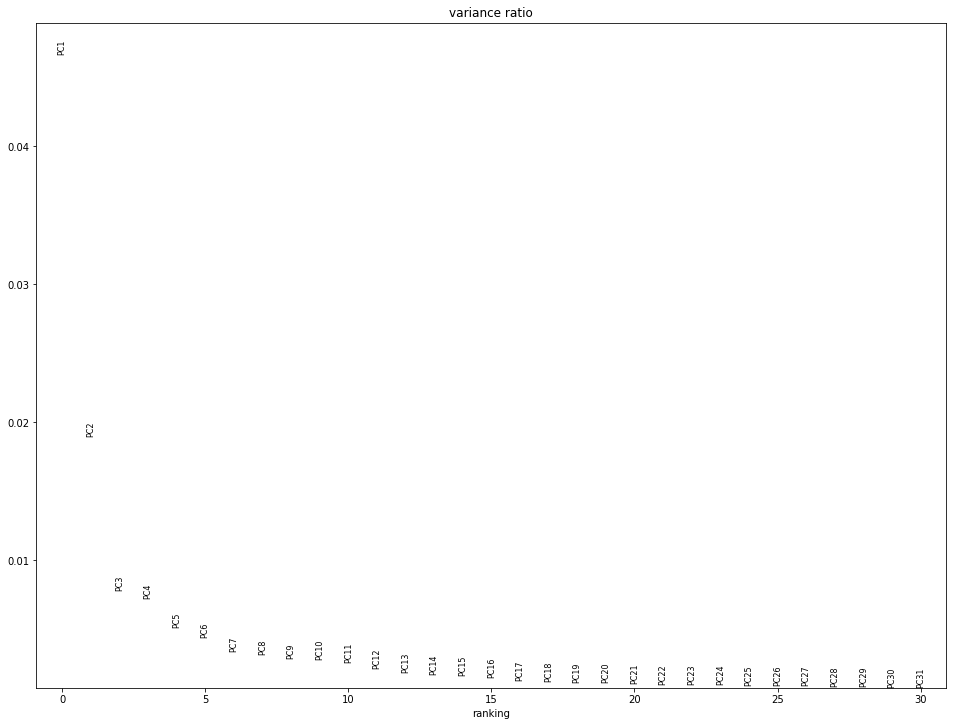

In [54]:
sc.pl.pca_variance_ratio(covid)

In [55]:
bbknn.bbknn(covid, neighbors_within_batch=int(150 / covid.obs.batch.unique().size), n_pcs=21)

In [56]:
sc.tl.umap(covid)

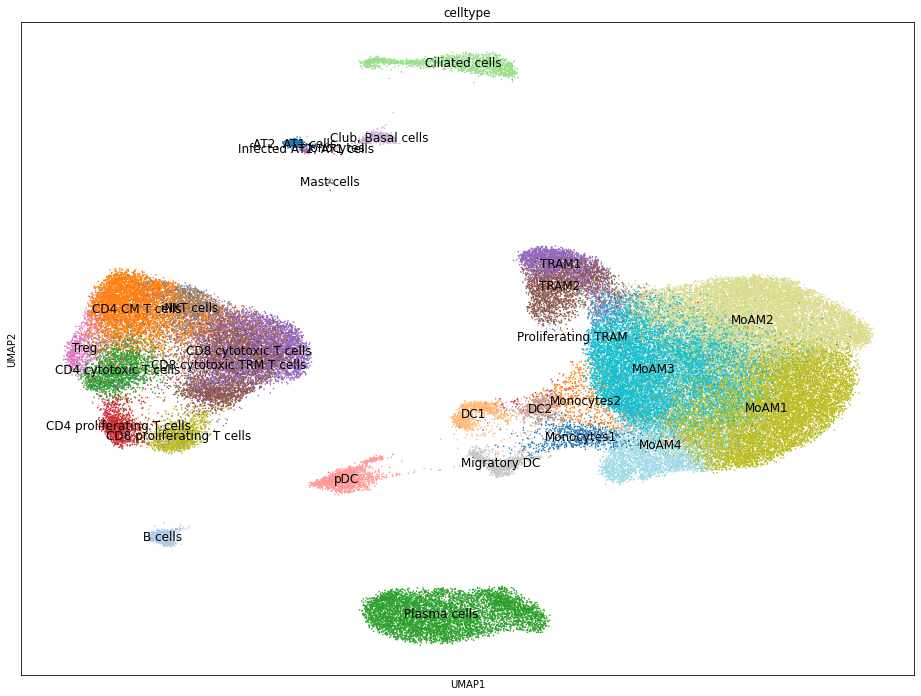

In [90]:
# V2
sc.pl.umap(
    covid, 
    color="celltype", 
    size=10, 
    legend_loc="on data",
#     legend_fontoutline=3,
    legend_fontweight="normal",
    legend_fontsize=12,
    palette=palette
)

In [63]:
pd.DataFrame(covid.obsm["X_umap"], columns=["x", "y"], index=covid.obs_names).to_csv("05covid-umap.tsv", sep="\t")

In [58]:
covid.write_h5ad("../data/04dataset/03obj-covid.h5ad")

In [306]:
sc.tl.rank_genes_groups(covid, "celltype", method="wilcoxon", n_genes=200)
covid_markers = sc_utils.get_markers(covid, "celltype")

In [307]:
covid_markers.sort_values(["cluster", "avg_logFC"], ascending=[True, False]).to_csv("03covid-markers.csv")